<a href="https://colab.research.google.com/github/cgmedina/airbnb-paris-dataset/blob/main/CarlosMedinaCrimeLADataSegundaParte.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Primera Parte (Pre entrega)**

# **Criminalidad en grandes ciudades: Caso Los Ángeles, California**

El presente análisis toma como base el repositorio de datos públicos de la ciudad de LA. Disponible en:

https://data.lacity.org/Public-Safety/Crime-Data-from-2020-to-Present/2nrs-mtv8/about_data

A partir del análisis de los datos evaluaremos la calidad de los mismos para responder las preguntas base del estudio:

1.   ¿Cuáles son los lugares y momentos con mayor incidencia de delitos en Los Ángeles?
2.   ¿Qué patrones se pueden identificar en los tipos de crímenes cometidos según la hora del día o el área geográfica?
3.	¿Cómo pueden estos patrones ayudar a predecir futuros delitos y guiar la asignación de recursos y políticas públicas de prevención?
4.	¿En qué zonas específicas de Los Ángeles se reportan más delitos violentos y no violentos?
5.	¿Cuál es la tendencia de criminalidad a lo largo del año o por estaciones
6.	¿A qué horas del día se cometen más delitos?
7.	¿Qué tipo de delitos son más frecuentes en determinadas áreas?
8.	¿Existen correlaciones entre ciertos tipos de crímenes y factores como la presencia policial o eventos públicos?

# Exploración inicial del dataset

Comencemos revisando los datos:


In [3]:
import pandas as pd

# Enlace del archivo CSV en formato raw desde GitHub
crime_data = 'https://data.lacity.org/api/views/2nrs-mtv8/rows.csv?accessType=DOWNLOAD'


# Cargar el dataset en un DataFrame
df = pd.read_csv(crime_data, on_bad_lines='skip')


# Mostrar las primeras filas del dataset
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,200412582,09/09/2020 12:00:00 AM,09/09/2020 12:00:00 AM,630,4,Hollenbeck,413,1,510,VEHICLE - STOLEN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,200 E AVENUE 28,NaN,34.0820,-118.2130


Del dataframe creado se pueden observar las siguientes caracteristicas de los datos:

In [6]:
rows, columns = df.shape

# Total de filas y columnas
print(f"Number of rows: {rows}")
print(f"Number of columns: {columns}")

Number of rows: 986873
Number of columns: 28


In [7]:
# Describiendo los datos
df.describe(include='all')

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
count,9.868730e+05,986873,986873,986873.000000,986873.000000,986873,986873.000000,986873.000000,986873.000000,986873,...,986872,986873,986862.000000,68634.000000,2296.000000,60.000000,986873,151963,986873.000000,986873.000000
unique,NaN,1790,1790,NaN,NaN,21,NaN,NaN,NaN,140,...,6,6,NaN,NaN,NaN,NaN,65273,10076,NaN,NaN
top,NaN,02/03/2023 12:00:00 AM,01/01/2020 12:00:00 AM,NaN,NaN,Central,NaN,NaN,NaN,VEHICLE - STOLEN,...,IC,Invest Cont,NaN,NaN,NaN,NaN,800 N ALAMEDA ST,BROADWAY,NaN,NaN
freq,NaN,929,1707,NaN,NaN,68966,NaN,NaN,NaN,111867,...,789360,789360,NaN,NaN,NaN,NaN,2581,2515,NaN,NaN
mean,2.196207e+08,NaN,NaN,1339.625672,10.634503,NaN,1109.868961,1.402229,500.542868,NaN,...,NaN,NaN,500.302638,957.813533,984.622822,990.750000,NaN,NaN,34.000132,-118.102011
std,1.360392e+07,NaN,NaN,651.413999,6.112366,NaN,611.338375,0.490348,205.593129,NaN,...,NaN,NaN,205.390720,110.633885,51.740796,27.908218,NaN,NaN,1.575104,5.458703
min,8.170000e+02,NaN,NaN,1.000000,1.000000,NaN,101.000000,1.000000,110.000000,NaN,...,NaN,NaN,110.000000,210.000000,310.000000,821.000000,NaN,NaN,0.000000,-118.667600
25%,2.101185e+08,NaN,NaN,900.000000,5.000000,NaN,583.000000,1.000000,331.000000,NaN,...,NaN,NaN,331.000000,998.000000,998.000000,998.000000,NaN,NaN,34.014100,-118.431200
50%,2.209123e+08,NaN,NaN,1420.000000,11.000000,NaN,1132.000000,1.000000,442.000000,NaN,...,NaN,NaN,442.000000,998.000000,998.000000,998.000000,NaN,NaN,34.057900,-118.321400
75%,2.311054e+08,NaN,NaN,1900.000000,16.000000,NaN,1605.000000,2.000000,626.000000,NaN,...,NaN,NaN,626.000000,998.000000,998.000000,998.000000,NaN,NaN,34.161600,-118.273900


In [8]:
#Exploremos las fechas de los datos
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], errors='coerce')
print(f"Valores NaT en 'DATE OCC': {df['DATE OCC'].isna().sum()}")

# Ignorar los valores NaN y obtener la menor y mayor fecha
min_reported_date = df['DATE OCC'].dropna().min()
max_reported_date = df['DATE OCC'].dropna().max()

print(f"Menor fecha: {min_reported_date}")
print(f"Mayor fecha: {max_reported_date}")

<ipython-input-8-fa1a2a2acaf7>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], errors='coerce')


Valores NaT en 'DATE OCC': 0
Menor fecha: 2020-01-01 00:00:00
Mayor fecha: 2024-11-24 00:00:00


# Determinación inicial de la variable objetivo

Aunque tenemos datos que abarcan más de 4 años, la naturaleza del dataset no lo convierte en una serie temporal, ya que el tiempo no constituye el eje central de los datos. Cada registro o fila es independiente del anterior, los datos no presentan periodicidad, y no existe una dependencia temporal en la ocurrencia o registro de los crímenes.


Recordemos las preguntas que queremos responder con este análisis:


*   ¿Qué patrones se pueden identificar en los tipos de crímenes cometidos según la hora del día o el área geográfica?
*   ¿Cómo pueden estos patrones ayudar a predecir futuros delitos y guiar la asignación de recursos y políticas públicas de prevención?





En este caso, la variable principal de estudio es la ocurrencia de ciertos tipos de crímenes. Por ello, comenzaremos revisando las columnas 'Crm Cd 1' y 'Crm Cd Desc', que reflejan el tipo de crimen y su descripción, respectivamente.

In [9]:
# Ver la distribución de 'crm_cd_1'
print(df['Crm Cd 1'].value_counts())

Crm Cd 1
510.0    111848
624.0     74573
330.0     62057
354.0     61151
740.0     60168
          ...  
430.0         5
445.0         4
884.0         4
926.0         1
453.0         1
Name: count, Length: 142, dtype: int64


In [10]:
# Ver la distribución de 'crm_cd_Desc'
print(df['Crm Cd Desc'].value_counts())

Crm Cd Desc
VEHICLE - STOLEN                                           111867
BATTERY - SIMPLE ASSAULT                                    74244
BURGLARY FROM VEHICLE                                       62010
THEFT OF IDENTITY                                           61141
VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)     60075
                                                            ...  
FIREARMS RESTRAINING ORDER (FIREARMS RO)                        4
DISHONEST EMPLOYEE ATTEMPTED THEFT                              4
FAILURE TO DISPERSE                                             4
TRAIN WRECKING                                                  1
DRUNK ROLL - ATTEMPT                                            1
Name: count, Length: 140, dtype: int64


Hay una diferencia entre los dos valores, cuando ambos deberían reflejar lo mismo. Esto puede deberse a errores de codificación o datos faltantes, revisemos ambas columnas para evaluar.

In [11]:

# Filtrar los códigos que tienen más de una descripción única
repetidos = df.groupby('Crm Cd 1')['Crm Cd Desc'].nunique()
repetidos = repetidos[repetidos > 1]

# Mostrar los códigos repetidos y la cantidad de descripciones únicas para cada uno
print("Códigos de crimen con múltiples descripciones y la cantidad de descripciones únicas:")
print(repetidos)

# Mostrar la cantidad total de códigos que están repetidos
print("\nCantidad de códigos de crimen con múltiples descripciones:")
print(len(repetidos))


Códigos de crimen con múltiples descripciones y la cantidad de descripciones únicas:
Crm Cd 1
210.0     4
230.0     4
235.0     2
236.0     2
237.0     6
310.0     4
330.0     5
331.0     5
341.0     7
343.0     2
349.0     2
350.0     4
354.0     3
410.0     2
420.0     5
433.0     2
434.0    10
436.0     2
437.0     3
438.0     2
440.0     4
441.0     3
442.0     2
450.0     2
480.0     3
510.0     3
520.0     2
521.0     3
522.0     2
622.0     2
624.0    10
625.0     8
626.0    13
627.0     6
647.0     2
648.0     3
649.0     4
660.0     2
661.0     3
662.0     2
740.0     4
745.0     5
753.0     2
755.0     3
760.0     4
761.0     2
762.0     4
763.0     2
805.0     3
810.0     3
812.0     7
822.0     2
860.0     3
886.0     2
888.0     4
900.0     4
901.0     3
902.0     2
906.0     2
Name: Crm Cd Desc, dtype: int64

Cantidad de códigos de crimen con múltiples descripciones:
59


La variable 'Crm Cd 1' tiene mejor calidad como variable objetivo, ya que es más consistente, estructurada, fácil de usar en modelos predictivos y requiere menos procesamiento previo. Al ser un código numérico, ofrece una clasificación clara y sin ambigüedades, mientras que 'Crm Cd Desc' puede tener problemas de redundancia, inconsistencia y sería más complicado de procesar para análisis automatizados.

De momentos esta será nuestra variable objetivo, aunque seguiremos explorando los datos.


In [12]:
df['Crm Cd 1'].describe()

,Crm Cd 1
count,986862.000000
mean,500.302638
std,205.390720
min,110.000000
25%,331.000000
50%,442.000000
75%,626.000000
max,956.000000


In [13]:
df['Crm Cd 1'].value_counts().sort_values(ascending=False)

,count
Crm Cd 1,
510.0,111848
624.0,74573
330.0,62057
354.0,61151
740.0,60168
...,...
430.0,5
445.0,4
884.0,4


Veamos la frecuencia de distribución de cada código de crímen

In [14]:
# Conteo de los tipos de crímenes
crime_code_counts = df['Crm Cd 1'].value_counts()
print(crime_code_counts)

Crm Cd 1
510.0    111848
624.0     74573
330.0     62057
354.0     61151
740.0     60168
          ...  
430.0         5
445.0         4
884.0         4
926.0         1
453.0         1
Name: count, Length: 142, dtype: int64


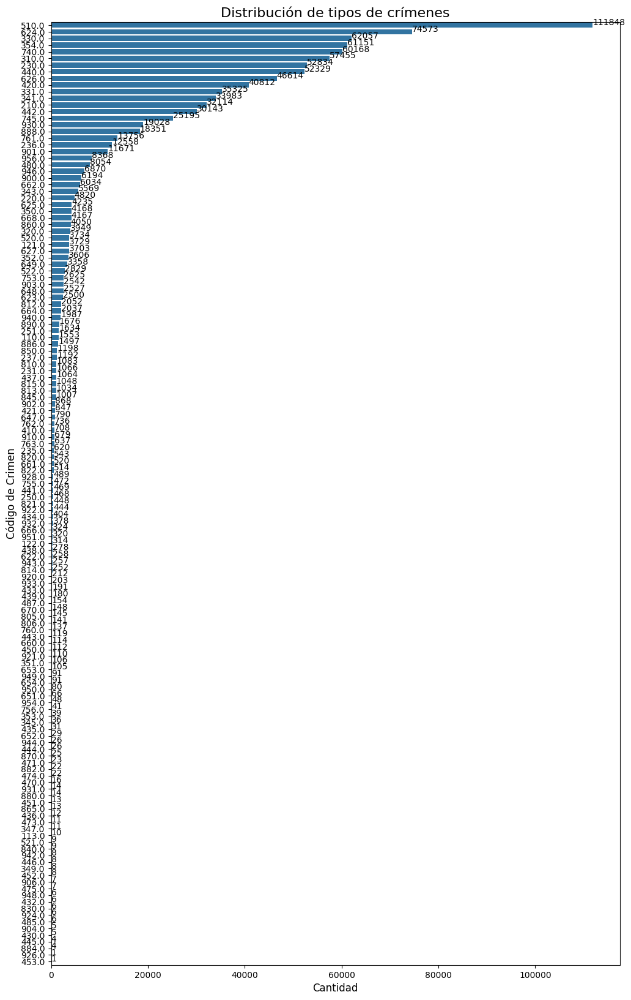

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,20))
sns.countplot(y='Crm Cd 1', data=df, order=crime_code_counts.index)
plt.title('Distribución de tipos de crímenes', fontsize=16)
plt.xlabel('Cantidad', fontsize=12)
plt.ylabel('Código de Crimen', fontsize=12)
for index, value in enumerate(crime_code_counts.values):
    plt.text(value, index, str(value))

plt.show()


Comenzaremos analizando los crímenes más comunes, para ello utilizaremos las columnas 'Crm Cd 1' y 'Crm Cd Desc'

In [16]:
# Agrupar por 'crm_cd_1' y 'crm_cd_desc' y contar las ocurrencias
crime_counts = df.groupby(['Crm Cd 1', 'Crm Cd Desc']).size().reset_index(name='ocurrencias')

# Calcular el porcentaje del total
total_crimes = crime_counts['ocurrencias'].sum()
crime_counts['% del total'] = (crime_counts['ocurrencias'] / total_crimes) * 100

# Ordenar por número de ocurrencias de mayor a menor
crime_counts_sorted = crime_counts.sort_values(by='ocurrencias', ascending=False)

# Calcular el porcentaje acumulado
crime_counts_sorted['% acumulado'] = crime_counts_sorted['% del total'].cumsum()

# Mostrar el DataFrame resultante
crime_counts_sorted

,Crm Cd 1,Crm Cd Desc,ocurrencias,% del total,% acumulado
125,510.0,VEHICLE - STOLEN,111839,11.332790,11.332790
137,624.0,BATTERY - SIMPLE ASSAULT,74233,7.522126,18.854916
32,330.0,BURGLARY FROM VEHICLE,62008,6.283351,25.138267
62,354.0,THEFT OF IDENTITY,61141,6.195496,31.333763
200,740.0,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",60074,6.087376,37.421139
...,...,...,...,...,...
163,626.0,"SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W...",1,0.000101,99.999595
165,626.0,SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO...,1,0.000101,99.999696
166,626.0,VEHICLE - STOLEN,1,0.000101,99.999797
170,627.0,CHILD PORNOGRAPHY,1,0.000101,99.999899


In [17]:
from google.colab import files

# Guardar el DataFrame resultante en un archivo CSV
crime_counts_sorted.to_csv('crime_counts_sorted.csv', index=False)
files.download('crime_counts_sorted.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Análisis exploratorio

Explorar las demás variables del dataset nos ayudará a identificar patrones, relaciones entre variables y posibles características importantes para el análisis posterior.

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 986873 entries, 0 to 986872
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DR_NO           986873 non-null  int64         
 1   Date Rptd       986873 non-null  object        
 2   DATE OCC        986873 non-null  datetime64[ns]
 3   TIME OCC        986873 non-null  int64         
 4   AREA            986873 non-null  int64         
 5   AREA NAME       986873 non-null  object        
 6   Rpt Dist No     986873 non-null  int64         
 7   Part 1-2        986873 non-null  int64         
 8   Crm Cd          986873 non-null  int64         
 9   Crm Cd Desc     986873 non-null  object        
 10  Mocodes         839400 non-null  object        
 11  Vict Age        986873 non-null  int64         
 12  Vict Sex        846266 non-null  object        
 13  Vict Descent    846254 non-null  object        
 14  Premis Cd       986857 non-null  flo

Columnas como DR_NO, Date Rptd, DATE OCC, TIME OCC, AREA, Crm Cd, Crm Cd Desc, Vict Age, LOCATION, LAT, y LON parecen tener datos completos o casi completos, por lo que pueden considerarse como variables principales para el análisis.

Por otro lado, columnas como Weapon Used Cd, Weapon Desc, Cross Street, y las columnas adicionales de códigos de crímenes contienen demasiados valores faltantes. Estas columnas podrían no ser útiles para un análisis a gran escala, a menos que se decida imputar los datos faltantes. Esta información la obtendremos cuando analicemos las preguntas a responder con la data.

Las columnas Date Rptd y DATE OCC están en formato object, pero deberían ser convertidas a formato datetime para facilitar el análisis de datos temporales.

Columnas como AREA NAME, Crm Cd Desc, Status Desc, entre otras, son de tipo object y contienen texto, lo cual es adecuado para categorizaciones o descripciones.

Finalmente, columnas como DR_NO, TIME OCC y AREA están tipadas como enteros; sin embargo, estas se refieren a códigos y valores de tiempo, por lo que es recomendable revisarlas con mayor detalle para asegurar su correcta interpretación.


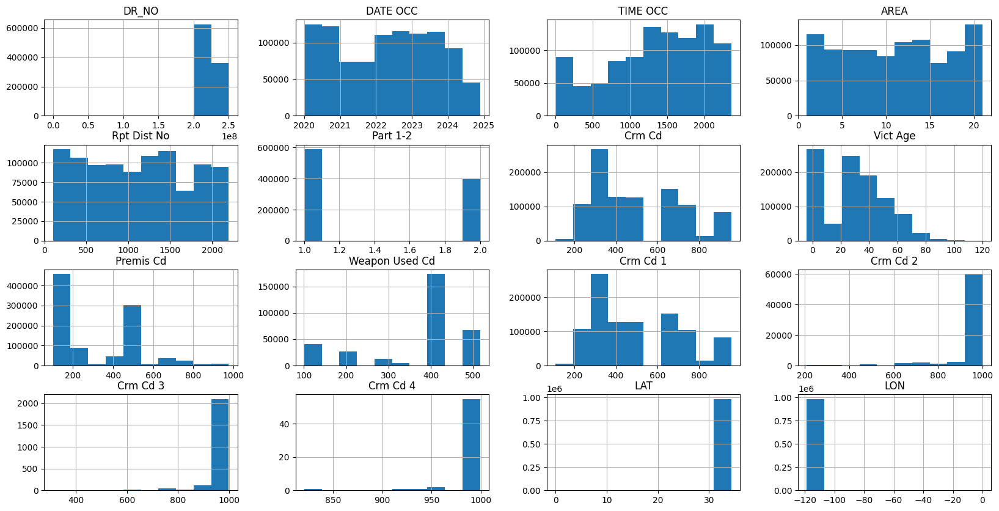

In [19]:
import matplotlib.pyplot as plt
df.hist(figsize=(20,10))
plt.show()

# **Preguntas del análisis**

Nos concentraremos cada una de las preguntas que queremos responder con estos datos.

¿Qué patrones se pueden identificar en los tipos de crímenes cometidos según la hora del día o el área geográfica?

Comenzaremos analizando las variables que pueden ayudar a responder esta pregunta:

**Análisis por hora del día**

La variable TIME_OCC nos puede dar indicios sobre si los crímenes se concentran en ciertas horas del día. Por eso analizaremos la calidad de la variable



In [20]:
# Obtener una muestra aleatoria de 20 datos de la columna "TIME OCC"
muestra_aleatoria = df['TIME OCC'].sample(n=20, random_state=1)
muestra_aleatoria

,TIME OCC
79290,1130
189216,2250
898708,1800
729730,1930
953052,2045
64825,2000
916658,300
29601,340
304088,1930
168169,700


In [21]:
# Convertir 'TIME OCC' a numérico y verificar si está entre 0 y 2359

# Respaldamos en crime_data nuestro dataset
crime_data=df

crime_data['TIME OCC'] = pd.to_numeric(crime_data['TIME OCC'], errors='coerce')

# Filtrar valores fuera del rango
time_valid_range = crime_data[(crime_data['TIME OCC'] >= 0) & (crime_data['TIME OCC'] <= 2359)]

# Contar los valores válidos y no válidos
valores_validos = time_valid_range.shape[0]
valores_invalidos = crime_data.shape[0] - valores_validos

valores_validos, valores_invalidos

(986873, 0)

# Observación
Tenemos la ventaja de que la variable tiene datos válidos para el 100% de los registros, por lo que no necesitamos hacer mayores transformaciones para trabajar con ella. Sin embargo podríamos obtener variables útiles como indicadores de "Mañana","Tarde","Noche" basados en esta variable.

Veamos cómo está distribuida la variable

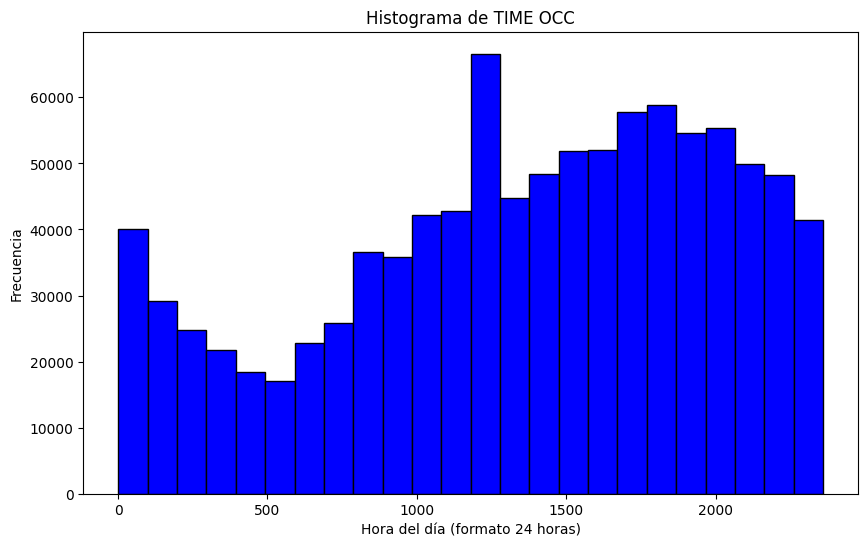

In [22]:
import matplotlib.pyplot as plt

# Como ya tenemos valores numéricos del paso anterior no hace falta transformar la columna TIME_OCC
# Creamos el histograma
plt.figure(figsize=(10,6))
plt.hist(crime_data['TIME OCC'].dropna(), bins=24, color='blue', edgecolor='black')
plt.title('Histograma de TIME OCC')
plt.xlabel('Hora del día (formato 24 horas)')
plt.ylabel('Frecuencia')
plt.show()

# Observación

*   Los picos en las horas de la mañana y madrugada pueden estar relacionados con actividades específicas (por ejemplo, incidentes relacionados con la vida nocturna o la apertura de negocios).
*   Las franjas horarias entre las 1000 y las 1800 horas, que muestran una distribución más constante, pueden indicar que muchas actividades delictivas ocurren durante el horario laboral o de alta actividad comercial.

# Análisis por franja horaria

Definamos una variable por franja horaria que nos permita analizar mejor la cantidad de crímenes


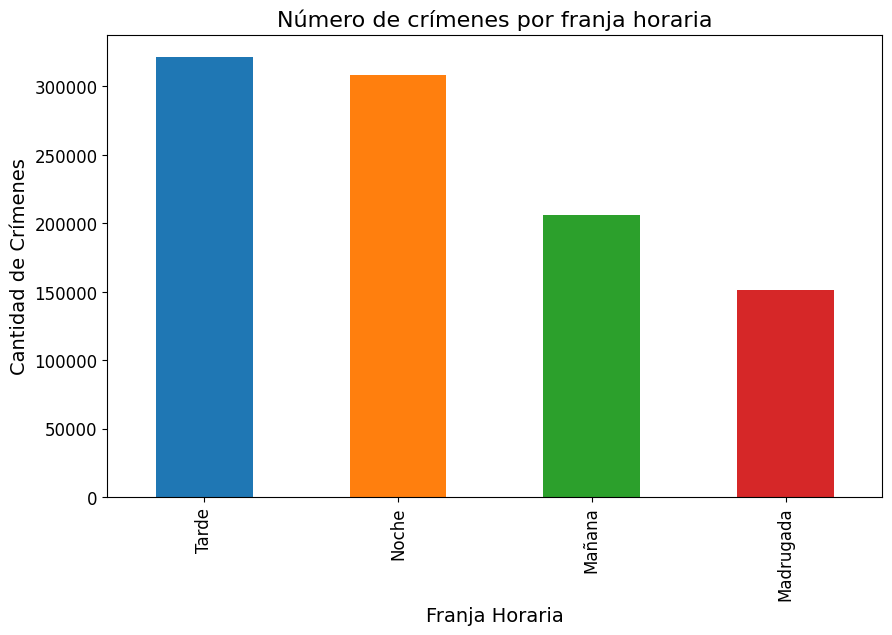

In [23]:
# Convirtamos el formato de TIME OCC a un formato más legible (horas de 24 horas)
crime_data['Hour'] = crime_data['TIME OCC'] // 100

# Definir las franjas horarias
def categorizar_hora(hora):
    if 0 <= hora < 6:
        return 'Madrugada'
    elif 6 <= hora < 12:
        return 'Mañana'
    elif 12 <= hora < 18:
        return 'Tarde'
    else:
        return 'Noche'

# Aplicar la función para categorizar las horas
crime_data['Franja Horaria'] = crime_data['Hour'].apply(categorizar_hora)

# Contar los crímenes por franja horaria
crimenes_por_franja = crime_data['Franja Horaria'].value_counts()

# Graficar
plt.figure(figsize=(10,6))
colores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
crimenes_por_franja.plot(kind='bar', color=colores)

# Añadir título y etiquetas a los ejes
plt.title('Número de crímenes por franja horaria', fontsize=16)
plt.xlabel('Franja Horaria', fontsize=14)
plt.ylabel('Cantidad de Crímenes', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()

# Observaciones


1.   Tarde y Noche:

*   La tarde y la noche son los periodos del día con mayor cantidad de crímenes registrados.
*   Esto sugiere que las actividades delictivas tienden a aumentar a medida que avanza el día, lo cual es común en muchas ciudades donde las personas están más activas durante la tarde y la noche.

2.   Mañana:

*   El número de crímenes en la mañana es significativamente menor en comparación con la tarde y la noche. Esto podría estar relacionado con el hecho de que muchas actividades comerciales y sociales aún no han comenzado por completo en las primeras horas del día.
3.   Madrugada:

*   La madrugada (de 00:00 a 06:00) tiene el menor número de crímenes. Esto es coherente con la disminución de la actividad pública en esas horas, ya que la mayoría de las personas están descansando o los negocios están cerrados.

# Relación entre la franja horaria y el tipo de crímen:

Con la primera impresión que obtuvimos de los datos, para profundizar en nuestra pregunta podemos revisar la cantidad de crímenes que hay por tipo de crimen y franja horaria



In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Crearemos una tabla pivote para comparar  'Franja Horaria' y el tipo de crimen 'Crm Cd 1'
crimenes_por_franja_tipo = crimenes_por_franja_tipo = crime_data.pivot_table(index='Franja Horaria', columns='Crm Cd 1', aggfunc='size', fill_value=0)

# Mostraremos las primeras filas de la tabla para verificar
crimenes_por_franja_tipo.head()

Crm Cd 1,110.0,113.0,121.0,122.0,210.0,220.0,230.0,231.0,235.0,236.0,...,942.0,943.0,944.0,946.0,948.0,949.0,950.0,951.0,954.0,956.0
Franja Horaria,,,,,,,,,,,,,,,,,,,,,
Madrugada,425,1,1366,81,5989,764,9239,199,73,2931,...,1,32,5,1135,2,10,15,37,4,915
Mañana,195,1,435,54,5288,920,9390,128,130,2499,...,4,60,2,1517,1,34,15,48,14,2295
Noche,585,5,1201,120,10602,1614,18166,473,182,4242,...,2,67,9,2050,0,14,24,116,8,2050
Tarde,348,3,727,59,10235,1522,16039,266,235,2886,...,1,98,10,2168,3,33,26,119,22,3108


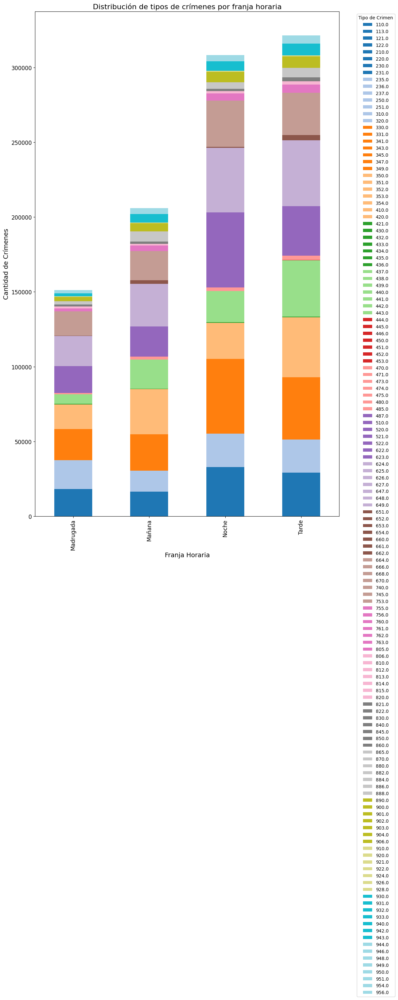

In [26]:
# Graficamos el gráfico de barras apilado
crimenes_por_franja_tipo.plot(kind='bar', stacked=True, figsize=(12,20), colormap='tab20')

plt.title('Distribución de tipos de crímenes por franja horaria', fontsize=16)
plt.xlabel('Franja Horaria', fontsize=14)
plt.ylabel('Cantidad de Crímenes', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.legend(title='Tipo de Crimen', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Este gráfico resulta dificil de entender y esto se debe a la gran cantidad de tipos de crímenes que tenemos. Utilicemos un heatmap para ver si el resultado mejora

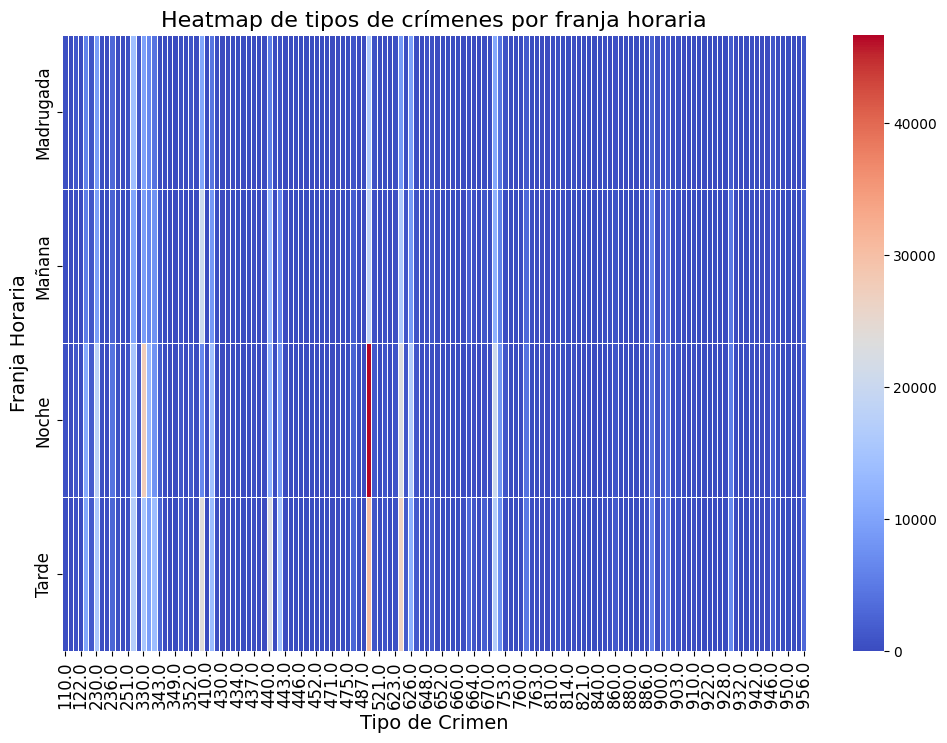

In [97]:
# Graficamos un heatmap de crímenes por franja horaria y tipo de crimen
plt.figure(figsize=(12,8))
sns.heatmap(crimenes_por_franja_tipo, cmap='coolwarm', linewidths=0.5)

plt.title('Heatmap de tipos de crímenes por franja horaria', fontsize=16)
plt.xlabel('Tipo de Crimen', fontsize=14)
plt.ylabel('Franja Horaria', fontsize=14)

plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)

plt.show()

Con la gran cantidad de categorías es dificil obtener resultados válidos de este conjunto, asi que antes de categorizar concentrémonos en las principales, las que concentran el 90% de los datos.

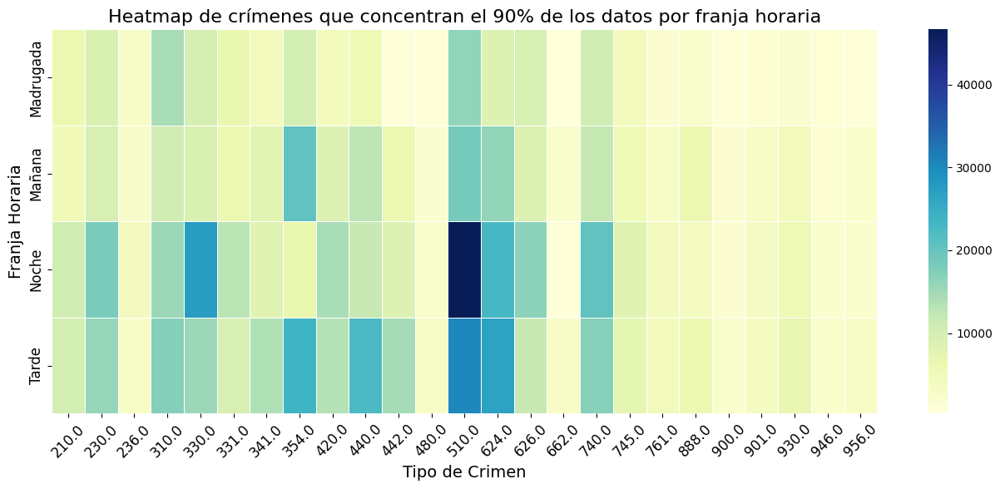

In [98]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Paso 1: Calcular la frecuencia de cada tipo de crimen
frecuencia_crimenes = crime_data['Crm Cd 1'].value_counts(normalize=True).cumsum()

# Paso 2: Seleccionar los tipos de crímenes que acumulan hasta el 90%
crimenes_90 = frecuencia_crimenes[frecuencia_crimenes <= 0.90].index

# Paso 3: Filtrar el DataFrame con solo los crímenes seleccionados
crime_data_90 = crime_data[crime_data['Crm Cd 1'].isin(crimenes_90)]

# Paso 4: Crear la tabla de contingencia entre franja horaria y los tipos de crímenes seleccionados
crimenes_por_franja_tipo_90 = pd.crosstab(crime_data_90['Franja Horaria'], crime_data_90['Crm Cd 1'])

# Paso 5: Graficar el heatmap
plt.figure(figsize=(16,6))
sns.heatmap(crimenes_por_franja_tipo_90, cmap='YlGnBu', linewidths=0.5)
plt.title('Heatmap de crímenes que concentran el 90% de los datos por franja horaria', fontsize=16)
plt.xlabel('Tipo de Crimen', fontsize=14)
plt.ylabel('Franja Horaria', fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.show()

# Observaciones generales del heatmap:


1.   **Mayor actividad delictiva en la tarde y noche**: Los colores más oscuros (azul) en las franjas horarias de tarde y noche indican una mayor cantidad de crímenes ocurridos en esas horas. Esto es consistente con el patrón general de que la actividad delictiva aumenta durante las horas de mayor movimiento social y comercial.
2.   **Crimen 510 (VEHICLE - STOLEN)**: Este crimen tiene una concentración significativamente alta en la mañana, como se ve por el color más oscuro en esa franja horaria. Esto sugiere que el robo de vehículos es más común en las primeras horas del día, posiblemente cuando las personas dejan sus vehículos sin vigilancia.
3.   **Crimen 330 (BURGLARY FROM VEHICLE)**: Vemos que este crimen es más frecuente en la noche, lo que tiene sentido dado que es más probable que los vehículos estén estacionados sin vigilancia durante estas horas.
4.   **Crimen 624 (BATTERY - SIMPLE ASSAULT)**: Hay una concentración moderada de este tipo de crimen en la tarde, lo que podría estar relacionado con altercados que ocurren durante horas de alta actividad social.
5.   **Crimen 354 (THEFT OF IDENTITY)**: Aunque la actividad para este crimen parece estar presente en varias franjas horarias, no se observa una concentración muy clara, lo que podría indicar que el robo de identidad no está tan vinculado a momentos específicos del día.
6.   **Crimen 740 (VANDALISM)**: Se observa una concentración en la tarde, que podría estar relacionada con la mayor actividad pública en esas horas.

Ya hemos cubierto la **hora del día** y los **tipos de crímenes más comunes**. Ahora, para continuar respondiendo la pregunta de **patrones en los tipos de crímenes según la hora del día o el área geográfica**, podemos enfocarnos en los **aspectos espaciales** del análisis.


# Análisis por área geográfica

Como las variable LAT y LON no tienen valores nulos, podemos utilizarlas para el análisis sin necesidad inicial de manejar valores faltantes y podemos proceder directamente a la creación de mapas













In [30]:
import plotly.express as px

# Filtrar los datos para las columnas necesarias (Latitud, Longitud, Tipo de Crimen)
#crime_data_filtered = crime_data[['LAT', 'LON', 'Crm Cd Desc']].dropna()

# Crear el mapa interactivo con Plotly
#fig = px.scatter_mapbox(crime_data_filtered,lat="LAT",lon="LON",hover_name="Crm Cd Desc",hover_data=["Crm Cd Desc"],color_discrete_sequence=["fuchsia"],zoom=10,height=600)

# Configurar el mapa usando el estilo 'open-street-map'
#fig.update_layout(mapbox_style="open-street-map")

# Mostrar el mapa
#fig.show()

El mapa se demora mucho en cargar y luego arroja error, probablemente algunos valores están fuera de rango, vamos a revisar si todos están dentro del rango válido

In [100]:
# Verificar si hay valores fuera de rango en latitud o longitud
invalid_coords = crime_data[(crime_data['LAT'] < -90) | (crime_data['LAT'] > 90) |
                            (crime_data['LON'] < -180) | (crime_data['LON'] > 180)]
print(invalid_coords)

Empty DataFrame
Columns: [DR_NO, Date Rptd, DATE OCC, TIME OCC, AREA, AREA NAME, Rpt Dist No, Part 1-2, Crm Cd, Crm Cd Desc, Mocodes, Vict Age, Vict Sex, Vict Descent, Premis Cd, Premis Desc, Weapon Used Cd, Weapon Desc, Status, Status Desc, Crm Cd 1, Crm Cd 2, Crm Cd 3, Crm Cd 4, LOCATION, Cross Street, LAT, LON, Hour, Franja Horaria]
Index: []

[0 rows x 30 columns]


##Muestreo del dataset

Todo apunta a que el tamaño del dataset influye en la generación del mapa

Vamos a probar generando un muestreo aleatorio del mapa.

In [31]:
# Obtener una muestra aleatoria del 10% de los datos
crime_data_sample = crime_data.sample(frac=0.1, random_state=1)

# Crear el mapa con la muestra
fig = px.scatter_mapbox(crime_data_sample, lat="LAT", lon="LON", zoom=10, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

A pesar de que ahora podemos generar el mapa sin problema para el conjunto reducido, es poco lo que podemos analizar del mismo dada la gran cantidad de datos y su distribución por la zona. Por eso veamos la densidad de los crímenes en ciertas partes de la ciudad

In [102]:
import folium
from folium.plugins import HeatMap

# Crear un mapa centrado en una ubicación aproximada
crime_map = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

# Agregar un heatmap con los puntos de latitud y longitud
heat_data = [[row['LAT'], row['LON']] for index, row in crime_data_sample.iterrows()]
HeatMap(heat_data).add_to(crime_map)

# Mostrar el mapa
crime_map

# Observaciones

Este gráfico de calor (heatmap) muestra la densidad de crímenes en diferentes zonas de Los Ángeles y sus alrededores. Aquí algunas observaciones clave:

1. **Alta concentración en el centro y sur de Los Ángeles**: Las áreas con mayor densidad de crímenes (las zonas en rojo y naranja) se encuentran principalmente en el centro y el sur de Los Ángeles. Esto podría indicar una alta actividad criminal en estas regiones.

2. **Zonas suburbanas con menos densidad de crímenes**: Las zonas más periféricas, como Thousand Oaks o Pasadena, muestran una menor densidad de crímenes, lo que sugiere que estas áreas suburbanas experimentan una menor incidencia de delitos.

3. **Patrón de distribución**: El mapa sugiere que los crímenes no están distribuidos de manera uniforme, sino que tienden a concentrarse en ciertas áreas urbanas más densamente pobladas y menos en áreas suburbanas o rurales.


Ahora analicemos los tipos de crímenes por zona geográfica:

In [27]:
!pip install geopandas
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 38.2 MB/s eta 0:00:00


<ipython-input-104-9f89ef36cb10>:15: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



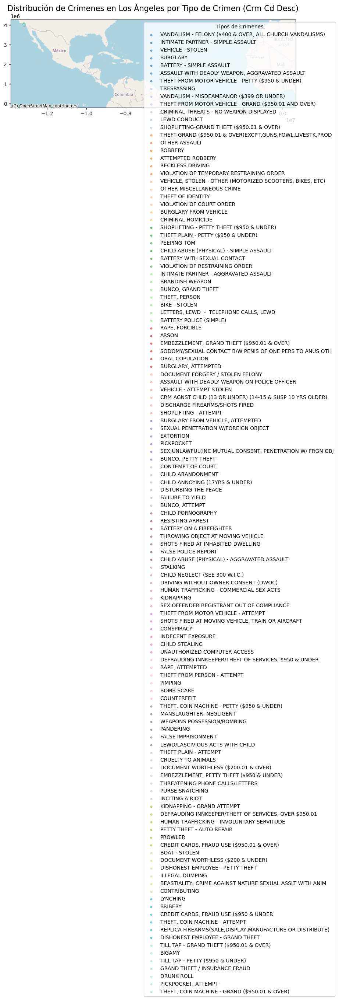

In [104]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx  # Para agregar fondo de mapa a la visualización

# Crear un GeoDataFrame de crime_data_sample usando las columnas de latitud y longitud
geometry = gpd.points_from_xy(crime_data_sample['LON'], crime_data_sample['LAT'])
crime_gdf = gpd.GeoDataFrame(crime_data_sample, geometry=geometry)

# Crear una proyección adecuada para trabajar con mapas
crime_gdf = crime_gdf.set_crs(epsg=4326)  # Sistema de coordenadas WGS84
crime_gdf = crime_gdf.to_crs(epsg=3857)  # Proyección adecuada para visualización en mapas web

# Definir colores para cada crimen único en 'Crm Cd Desc'
crime_types = crime_data_sample['Crm Cd Desc'].unique()
colors = plt.cm.get_cmap('tab20', len(crime_types))  # Elegimos una paleta de colores

# Crear el plot con Geopandas
fig, ax = plt.subplots(figsize=(10, 10))

# Graficar cada tipo de crimen con un color diferente
for i, crime_type in enumerate(crime_types):
    subset = crime_gdf[crime_gdf['Crm Cd Desc'] == crime_type]
    subset.plot(ax=ax, markersize=10, color=colors(i), label=crime_type, alpha=0.6)

# Añadir el mapa de fondo con contextily (mapa base de OpenStreetMap)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Personalizar leyenda y títulos
plt.title('Distribución de Crímenes en Los Ángeles por Tipo de Crimen (Crm Cd Desc)', fontsize=15)
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), title='Tipos de Crímenes')

# Mostrar el gráfico
plt.show()

Al haber tantos códigos resulta muy dificil analizar el gráfico. Es por ello que clasificaremos los códigos de crímenes de acuerdo a su gravedad. De la muestra veamos los crímenes más comunes

In [32]:
crime_counts = crime_data_sample['Crm Cd Desc'].value_counts().reset_index()
crime_counts.columns = ['Crm Cd Desc', 'Cantidad']

# Paso 2: Calcular el porcentaje y el porcentaje acumulado
crime_counts['Porcentaje'] = (crime_counts['Cantidad'] / crime_counts['Cantidad'].sum()) * 100
crime_counts['Porcentaje Acumulado'] = crime_counts['Porcentaje'].cumsum()

# Paso 3: Seleccionar aquellos crímenes que constituyen el 95% del total de los registros
crimenes_95 = crime_counts[crime_counts['Porcentaje Acumulado'] <= 95]

# Mostrar los crímenes que reúnen el 95% de los datos
print(crimenes_95)

                                          Crm Cd Desc  Cantidad  Porcentaje  \
0                                    VEHICLE - STOLEN     11310   11.460476   
1                            BATTERY - SIMPLE ASSAULT      7508    7.607892   
2                                   THEFT OF IDENTITY      6244    6.327074   
3                               BURGLARY FROM VEHICLE      6148    6.229797   
4   VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...      5941    6.020043   
5                                            BURGLARY      5728    5.804209   
6      ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT      5278    5.348222   
7                  THEFT PLAIN - PETTY ($950 & UNDER)      5187    5.256011   
8                   INTIMATE PARTNER - SIMPLE ASSAULT      4616    4.677414   
9     THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)      4009    4.062339   
10  THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...      3570    3.617498   
11  THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI..

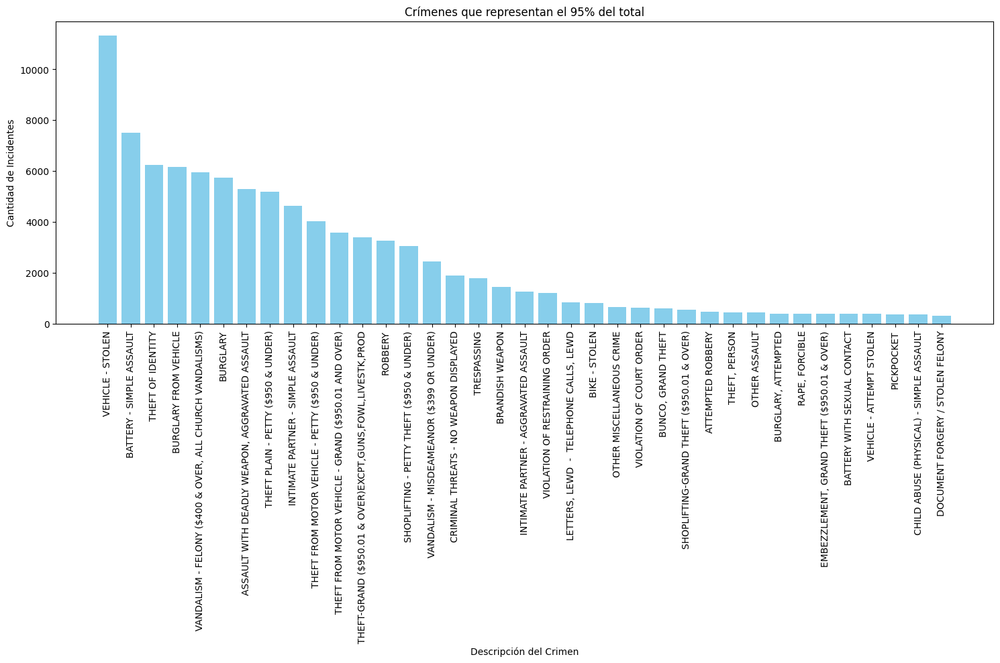

In [106]:
import matplotlib.pyplot as plt

# Paso 1: Crear el histograma utilizando un gráfico de barras
plt.figure(figsize=(15, 10))
plt.bar(crimenes_95['Crm Cd Desc'], crimenes_95['Cantidad'], color='skyblue')

# Paso 2: Añadir títulos y etiquetas
plt.title('Crímenes que representan el 95% del total')
plt.xlabel('Descripción del Crimen')
plt.ylabel('Cantidad de Incidentes')

# Paso 3: Rotar las etiquetas del eje X para que se vean mejor
plt.xticks(rotation=90)

# Ajustar el gráfico para que las etiquetas no se corten
plt.tight_layout()

# Paso 4: Mostrar el gráfico
plt.show()

### Clasificaciones basadas en el Código Penal de California:

#### 1. Felonía:
   * **Descripción**: Son los delitos más graves según la ley de California. Pueden conllevar penas severas, que incluyen tiempo en prisión estatal, multas importantes o incluso cadena perpetua en casos extremos.
   * **Ejemplos**:
      - Homicidio
      - Robo con violencia
      - Violación
      - Abuso de menores
      - Robo de vehículos

#### 2. Delito Menor (Misdemeanor):
   * **Descripción**: Delitos menos graves que las felonías. Generalmente conllevan penas de hasta un año en una cárcel del condado, multas o servicio comunitario.
   * **Ejemplos**:
      - Vandalismo menor
      - Robo menor
      - Infracciones de tránsito graves
      - Asalto simple

#### 3. Delito Contra la Propiedad:
   * **Descripción**: Estos delitos implican daños o robos a la propiedad sin violencia directa hacia las personas. Pueden ser procesados como felonías o delitos menores según la gravedad.
   * **Ejemplos**:
      - Robo de identidad
      - Hurto de vehículos
      - Allanamiento
      - Vandalismo

#### 4. Delito Violento:
   * **Descripción**: Son crímenes que involucran daño físico o la amenaza de daño a una persona. Suelen ser considerados de alta gravedad por el impacto físico o psicológico que tienen sobre las víctimas.
   * **Ejemplos**:
      - Agresión con violencia
      - Robo con violencia
      - Abuso doméstico grave
      - Homicidio

#### 5. Wobbler:
   * **Descripción**: Son delitos que pueden ser procesados tanto como una felonía o como un delito menor, dependiendo de las circunstancias del caso, la gravedad del delito y el historial criminal del acusado.
   * **Ejemplos**:
      - Robo
      - Vandalismo con daños cercanos al límite legal ($400 en daños)
      - Algunos tipos de asalto

In [33]:
# Función para clasificar crímenes según el Código Penal de California
def clasificar_por_codigo_penal(crime_desc):
    # Felonías: crímenes graves
    if crime_desc in ['HOMICIDE', 'ROBBERY', 'ASSAULT WITH DEADLY WEAPON',
                      'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
                      'RAPE', 'VEHICLE - STOLEN', 'AGGRAVATED ASSAULT',
                      'BURGLARY','BUNCO, GRAND THEFT','ATTEMPTED ROBBERY',
                      'BURGLARY, ATTEMPTED','RAPE, FORCIBLE',
                      'CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT','DISCHARGE FIREARMS/SHOTS FIRED',
                      'ARSON','EXTORTION',
                      'CRIMINAL HOMICIDE','CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)']:
        return 'Felonía'

    # Delitos Menores: crímenes menos graves
    elif crime_desc in ['VANDALISM - FELONY ($400 & OVER)', 'THEFT PLAIN - PETTY ($950 & UNDER)',
                        'INTIMATE PARTNER - SIMPLE ASSAULT', 'SHOPLIFTING',
                        'VIOLATION OF RESTRAINING ORDER', 'BATTERY - SIMPLE ASSAULT',
                        'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
                        'INTIMATE PARTNER - SIMPLE ASSAULT','SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
                        'TRESPASSING','LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
                        'VIOLATION OF COURT ORDER','EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)',
                        'DOCUMENT FORGERY / STOLEN FELONY','CONTEMPT OF COURT',
                        'BATTERY POLICE (SIMPLE)','FAILURE TO YIELD']:
        return 'Delito Menor'

    # Delitos Contra la Propiedad: crímenes relacionados con propiedad
    elif crime_desc in ['THEFT OF IDENTITY', 'BURGLARY FROM VEHICLE',
                        'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)',
                        'BIKE - STOLEN','THEFT, PERSON',
                        'PICKPOCKET','VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)',
                        'BUNCO, PETTY THEFT']:
        return 'Delito Contra la Propiedad'

    # Delitos Violentos: crímenes que involucran violencia
    elif crime_desc in ['ASSAULT', 'ROBBERY', 'INTIMATE PARTNER - AGGRAVATED ASSAULT',
                        'BATTERY WITH SEXUAL CONTACT']:
        return 'Delito Violento'

    # Wobblers: crímenes que pueden ser procesados como felonía o delito menor
    elif crime_desc in ['VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
                        'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)',
                        'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
                        'CRIMINAL THREATS - NO WEAPON DISPLAYED','BRANDISH WEAPON',
                        'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)','VEHICLE - ATTEMPT STOLEN']:
        return 'Wobbler'

    # Otros: para crímenes que no entran en las categorías anteriores
    else:
        return 'Otros'

# Aplicar la función a la columna 'Crm Cd Desc'
crime_data_sample['Clasificación Legal'] = crime_data_sample['Crm Cd Desc'].apply(clasificar_por_codigo_penal)

# Mostrar los primeros registros para verificar
crime_data_sample['Clasificación Legal'].value_counts()

,count
Clasificación Legal,
Delito Menor,32170
Felonía,28854
Delito Contra la Propiedad,18495
Wobbler,13657
Otros,3857
Delito Violento,1654


In [108]:
# Veamos los crímenes clasificados como "Otros"
otros_crimenes = crime_data_sample[crime_data_sample['Clasificación Legal'] == 'Otros']['Crm Cd Desc'].value_counts()
print(otros_crimenes)

Crm Cd Desc
OTHER MISCELLANEOUS CRIME                       650
OTHER ASSAULT                                   428
SHOTS FIRED AT INHABITED DWELLING               164
DISTURBING THE PEACE                            151
SEXUAL PENETRATION W/FOREIGN OBJECT             129
                                               ... 
THEFT, COIN MACHINE - ATTEMPT                     1
PETTY THEFT - AUTO REPAIR                         1
THEFT, COIN MACHINE - PETTY ($950 & UNDER)        1
MANSLAUGHTER, NEGLIGENT                           1
THEFT, COIN MACHINE - GRAND ($950.01 & OVER)      1
Name: count, Length: 80, dtype: int64


In [109]:
#Veamos cómo se distribuye grográficamente cada crímen
# Colores asociados a cada clasificación
colors = {
    'Felonía': 'red',
    'Delito Menor': 'blue',
    'Delito Contra la Propiedad': 'green',
    'Delito Violento': 'orange',
    'Wobbler': 'purple',
    'Otros': 'fuchsia'
}

# Crear el mapa con la clasificación legal usando colores
fig = px.scatter_mapbox(
    crime_data_sample,
    lat="LAT",
    lon="LON",
    color="Clasificación Legal",  # Colorear basado en 'Clasificación Legal'
    color_discrete_map=colors,  # Usar el esquema de colores personalizado
    zoom=9,
    height=1200,
    title="Distribución Geográfica por Clasificación Legal"
)

# Configurar el estilo del mapa
fig.update_layout(mapbox_style="open-street-map")

# Mostrar el mapa
fig.show()

### Algunas observaciones del gráfico

1. **Alta densidad de delitos contra la propiedad (verde)**: La mayoría de los puntos en el mapa representan delitos contra la propiedad. Se puede observar una concentración significativa en áreas densamente pobladas, como el centro de Los Ángeles y hacia el sur, lo que sugiere que en estas zonas los delitos relacionados con la propiedad, como robos y hurtos, son mucho más comunes.

2. **Delitos menores (azul) dispersos**: Los delitos menores, como vandalismo o pequeños robos, están bastante distribuidos en varias zonas del área, pero sin la misma intensidad que los delitos contra la propiedad. Esto podría indicar que estos delitos ocurren en áreas más residenciales y menos comerciales.

3. **Felonías (rojo) y delitos violentos (naranja) menos comunes pero concentrados**: Aunque los crímenes violentos y las felonías son menos numerosos en comparación con otros delitos, hay una clara concentración de estos incidentes en ciertas áreas del sur de Los Ángeles y Long Beach, lo que podría indicar zonas más conflictivas en términos de violencia.

4. **Zonas más seguras**: Al observar zonas donde apenas hay puntos, como las áreas más alejadas del centro y algunas zonas costeras, se puede inferir que son áreas con una menor incidencia de crímenes registrados, especialmente en términos de delitos violentos o graves.

5. **Wobblers (púrpura) dispersos**: Los delitos clasificados como wobblers, que pueden procesarse como delitos menores o felonías, están dispersos en todo el mapa, lo que sugiere que estos delitos son comunes en diferentes tipos de áreas, tanto residenciales como comerciales.


<Figure size 500x400 with 0 Axes>

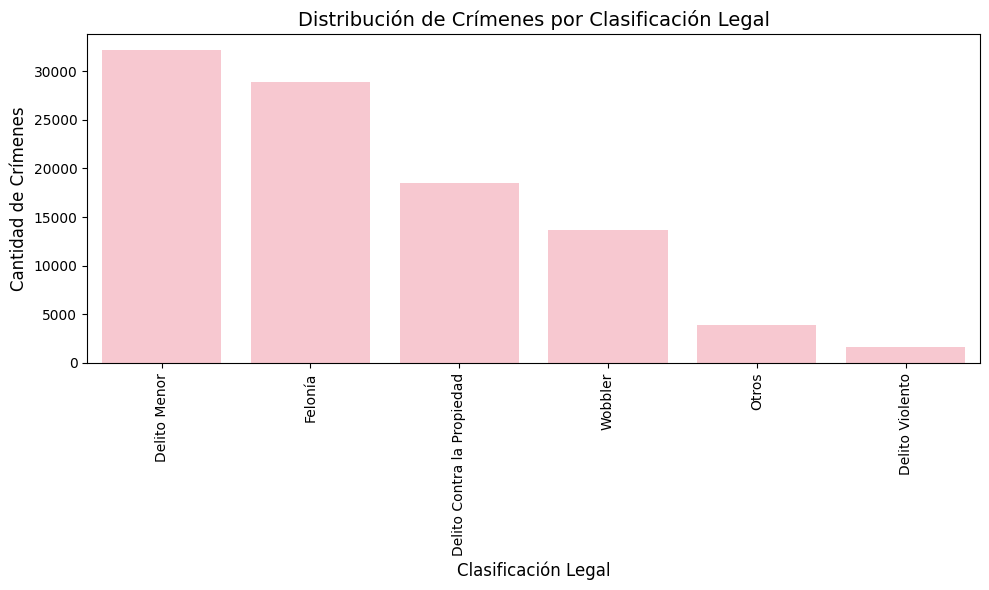

In [110]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el tamaño de la gráfica
plt.figure(figsize=(5, 4))

import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el tamaño de la gráfica
plt.figure(figsize=(10, 6))

# Crear el histograma con color rosado
sns.countplot(x='Clasificación Legal', data=crime_data_sample, color='pink')

# Título y etiquetas
plt.title('Distribución de Crímenes por Clasificación Legal', fontsize=14)
plt.xlabel('Clasificación Legal', fontsize=12)
plt.ylabel('Cantidad de Crímenes', fontsize=12)

# Rotar las etiquetas del eje X a vertical (90 grados)
plt.xticks(rotation=90)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

# Clasificación de crímenes por nivel de violencia

In [111]:
# Filtrar delitos violentos
delitos_violentos = crime_data_sample[crime_data_sample['Clasificación Legal'].isin(['Felonía', 'Delito Violento'])]

# Filtrar delitos no violentos
delitos_no_violentos = crime_data_sample[crime_data_sample['Clasificación Legal'].isin(['Delito Menor', 'Delito Contra la Propiedad', 'Wobbler'])]

# Mapa de delitos violentos
fig_violentos = px.scatter_mapbox(delitos_violentos, lat="LAT", lon="LON",
                                  color="Clasificación Legal", zoom=8,
                                  title="Delitos Violentos en Los Ángeles")
fig_violentos.update_layout(mapbox_style="open-street-map")
fig_violentos.show()

# Mapa de delitos no violentos
fig_no_violentos = px.scatter_mapbox(delitos_no_violentos, lat="LAT", lon="LON",
                                     color="Clasificación Legal", zoom=8,
                                     title="Delitos No Violentos en Los Ángeles")
fig_no_violentos.update_layout(mapbox_style="open-street-map")
fig_no_violentos.show()

Crearemos una función para esto y la utilizaremos más adelante

In [34]:
def create_violent_crime_column(crime_category):
    """
    Clasifica un crimen como 'Violento' o 'No Violento' basado en el valor de crime_category.

    Parámetros:
    ----------
    crime_category : str
        Categoría del crimen a clasificar.

    Retorna:
    -------
    str
        'Violento' si el crimen pertenece a una categoría violenta, 'No Violento' si pertenece a una categoría no violenta.
    """
    # Categorías de crímenes violentos y no violentos
    violent_categories = ['Felonía', 'Delito Violento']
    non_violent_categories = ['Delito Menor', 'Delito Contra la Propiedad', 'Wobbler']

    # Clasificar el crimen
    if crime_category in violent_categories:
        return 'Violento'
    elif crime_category in non_violent_categories:
        return 'No Violento'
    else:
        return 'Desconocido'  # Por si el valor no está clasificado

# Análisis de las variables del estudio

Veamos la calidad del muestreo obtenido respecto a todo el dataset,

Para ello revisaremos los porcentajes de datos faltantes, los datos con valores inválidos y trataremos de imputarlos, los outliers y la distribución de las variables principales para nuestro análisis.

También veremos si la muestra es representativa del dataset original y exploraremos las relaciones entre las variables numéricas para obtener indicadores importantes para el análisis

In [35]:
missing_percentage = (crime_data_sample.isnull().sum() / len(crime_data_sample)) * 100
print(missing_percentage)

DR_NO                   0.000000
Date Rptd               0.000000
DATE OCC                0.000000
TIME OCC                0.000000
AREA                    0.000000
AREA NAME               0.000000
Rpt Dist No             0.000000
Part 1-2                0.000000
Crm Cd                  0.000000
Crm Cd Desc             0.000000
Mocodes                15.044535
Vict Age                0.000000
Vict Sex               14.306849
Vict Descent           14.309889
Premis Cd               0.003040
Premis Desc             0.060798
Weapon Used Cd         67.037198
Weapon Desc            67.037198
Status                  0.000000
Status Desc             0.000000
Crm Cd 1                0.000000
Crm Cd 2               93.126754
Crm Cd 3               99.779100
Crm Cd 4               99.994933
LOCATION                0.000000
Cross Street           84.611955
LAT                     0.000000
LON                     0.000000
Hour                    0.000000
Franja Horaria          0.000000
Clasificac

In [36]:
duplicates = crime_data_sample.duplicated().sum()
print(f"Número de filas duplicadas: {duplicates}")

Número de filas duplicadas: 525


In [37]:
invalid_times = crime_data_sample[(crime_data_sample['TIME OCC'] < 0) | (crime_data_sample['TIME OCC'] > 2359)]
print(f"Entradas inválidas en TIME OCC: {len(invalid_times)}")

Entradas inválidas en TIME OCC: 0


In [38]:
invalid_coordinates = crime_data_sample[(crime_data_sample['LAT'] == 0) | (crime_data_sample['LON'] == 0)]
print(f"Número de coordenadas inválidas: {len(invalid_coordinates)}")

Número de coordenadas inválidas: 185


Observamos que tenemos 227 puntos con coordenada igual a cero, eliminaremos los mismos de la muestra

In [39]:
# Filtrar los registros con coordenadas válidas (donde LAT y LON no son 0)
crime_data_sample = crime_data_sample[(crime_data_sample['LAT'] != 0) & (crime_data_sample['LON'] != 0)]

# Verificar cuántos registros quedan después de la eliminación
print(f"Tamaño del dataset después de eliminar coordenadas inválidas: {crime_data_sample.shape[0]} filas y {crime_data_sample.shape[1]} columnas")

Tamaño del dataset después de eliminar coordenadas inválidas: 98502 filas y 31 columnas


In [40]:
crime_type_distribution = crime_data_sample['Crm Cd 1'].value_counts()
print(crime_type_distribution)

Crm Cd 1
510.0    11305
624.0     7512
354.0     6239
330.0     6149
740.0     5945
         ...  
475.0        1
444.0        1
446.0        1
474.0        1
473.0        1
Name: count, Length: 125, dtype: int64


In [41]:
original_distribution = crime_data['Crm Cd 1'].value_counts(normalize=True)
sample_distribution = crime_data_sample['Crm Cd 1'].value_counts(normalize=True)

comparison = pd.DataFrame({'Original': original_distribution, 'Muestra': sample_distribution})
print(comparison)

          Original   Muestra
Crm Cd 1                    
110.0     0.001574  0.001421
113.0     0.000010  0.000010
121.0     0.003779  0.004000
122.0     0.000318  0.000386
210.0     0.032542  0.033116
...            ...       ...
949.0     0.000092  0.000081
950.0     0.000081  0.000132
951.0     0.000324  0.000396
954.0     0.000049  0.000041
956.0     0.008479  0.008355

[142 rows x 2 columns]


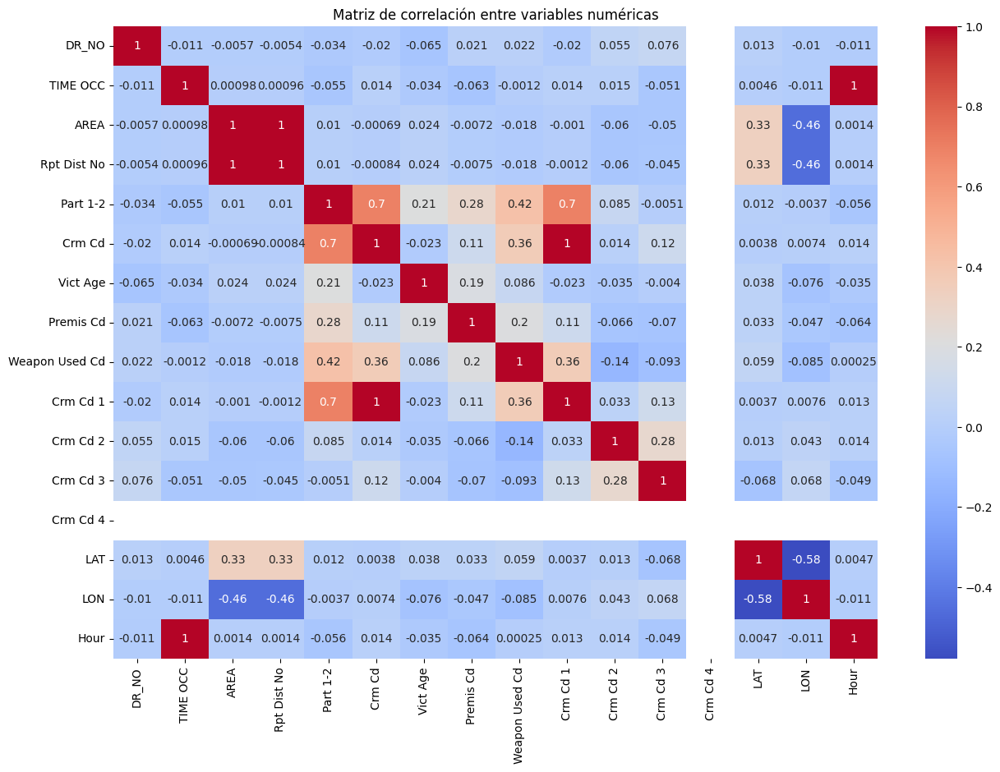

In [42]:
# Seleccionar solo las columnas numéricas
numeric_columns = crime_data_sample.select_dtypes(include=['float64', 'int64'])

# Calcular la matriz de correlación solo con las columnas numéricas
correlation_matrix = numeric_columns.corr()

# Visualizar la matriz de correlación
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15,10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación entre variables numéricas")
plt.show()

Vamos a concentrar el análisis en las variables con relación más significativa



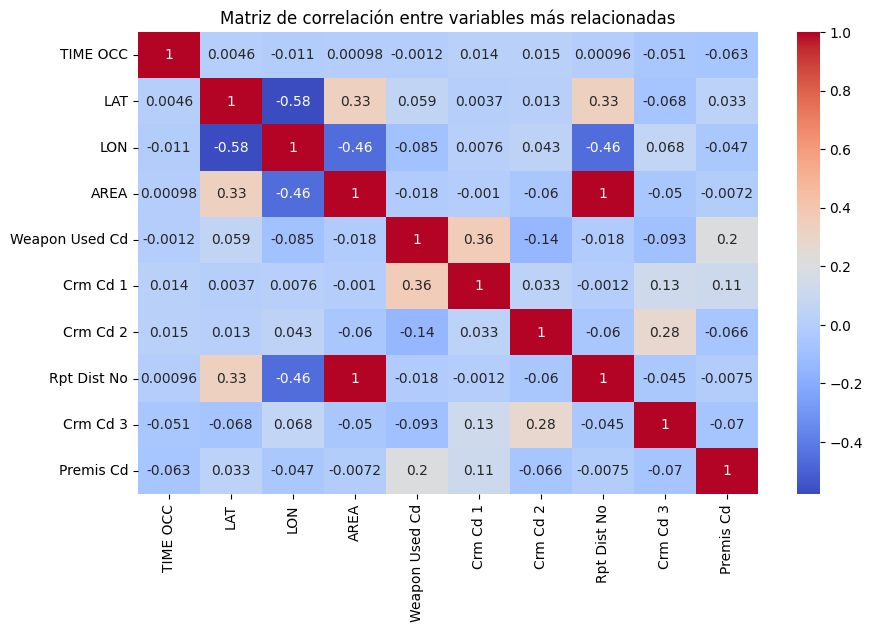

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar solo las columnas de interés
columnas_interes = ['TIME OCC', 'LAT', 'LON', 'AREA', 'Weapon Used Cd', 'Crm Cd 1', 'Crm Cd 2', 'Rpt Dist No', 'Crm Cd 3', 'Premis Cd']

# Filtrar el DataFrame con las columnas seleccionadas
subset_data = crime_data_sample[columnas_interes]

# Calcular la matriz de correlación
correlation_matrix_subset = subset_data.corr()

# Generar el heatmap con la matriz de correlación de las variables seleccionadas
plt.figure(figsize=(10,6))
sns.heatmap(correlation_matrix_subset, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación entre variables más relacionadas")
plt.show()

### Observaciones de los resultados:

1. **Variables geográficas (LAT y LON) con otras variables:**
   - El hecho de que **LAT** y **LON** (latitud y longitud) no estén fuertemente correlacionadas con variables como el tipo de crimen o la hora del día sugiere que los crímenes no están concentrados en ciertas áreas geográficas específicas o que el tipo de crimen no depende de una ubicación precisa. Esto podría implicar que los crímenes se distribuyen de manera más uniforme por toda la ciudad, sin que haya zonas claramente más peligrosas en términos de tipo de crimen o momento del día.

2. **Hora del crimen (TIME OCC) y ubicación (LAT, LON):**
   - Una correlación baja entre la **hora del crimen** y la **ubicación geográfica** significa que no existe un patrón claro que relacione los crímenes con una hora específica del día en una zona concreta. Los crímenes ocurren en diferentes horas y en diferentes lugares sin seguir un patrón horario marcado por la ubicación.

3. **Implicación para la predicción y el análisis:**
   - Para nuestro análisis, esto implica que no es posible hacer predicciones fuertes solo en base a la ubicación geográfica y el horario. Las variables como el tipo de crimen o el uso de armas pueden depender de otros factores (económicos, sociales, etc.) que no están capturados en esta matriz de correlación.
   - El hecho de que no haya relaciones fuertes entre las variables también puede significar que necesitamos explorar más datos o aplicar modelos más complejos para descubrir patrones ocultos que no se revelan con correlaciones simples.


# **Fin de la primera parte**

# **Segunda Parte**



En esta segunda parte trataremos de identificar algún modelo que podamos construir desde nuestro dataset y agregue valor a nuestro público objetivo.

El análisis anterior mostró poca correlación entre la ubicación de los crímenes y otras variables del modelo, sin embargo, la idea de esta segunda fase es reducir la cantidad de variables independientes para obtener un modelo con mayor calidad.

Considerando, que gran parte de los datos del modelo son categóricos, y el contexto de nuestro dominio, hemos identificado la siguiente hipótesis y veremos si es factible construir y entrenar un modelo que nos ayude a predecirla.

**Hipótesis:**

“El estado de un caso (Status) puede clasificarse como ‘Resuelto’ o ‘No Resuelto’ basándose en las características del crimen.”

Comencemos analizando la variable objetivo (Status):

In [44]:
# Seleccionar las columnas "Status" y "Status Desc" y eliminar duplicados
status_table = crime_data[['Status', 'Status Desc']].drop_duplicates()

# Contar la cantidad de crímenes para cada valor de "Status"
status_counts = crime_data['Status'].value_counts().reset_index()
status_counts.columns = ['Status', 'Crime Count']

# Combinar la tabla original con los conteos
status_table = status_table.merge(status_counts, on='Status', how='left')

# Mostrar la tabla resultante
print(status_table)

  Status   Status Desc  Crime Count
0     AA  Adult Arrest      85346.0
1     IC   Invest Cont     789360.0
2     AO   Adult Other     107087.0
3     JA    Juv Arrest       3252.0
4     JO     Juv Other       1821.0
5     CC           UNK          6.0
6    NaN           UNK          NaN


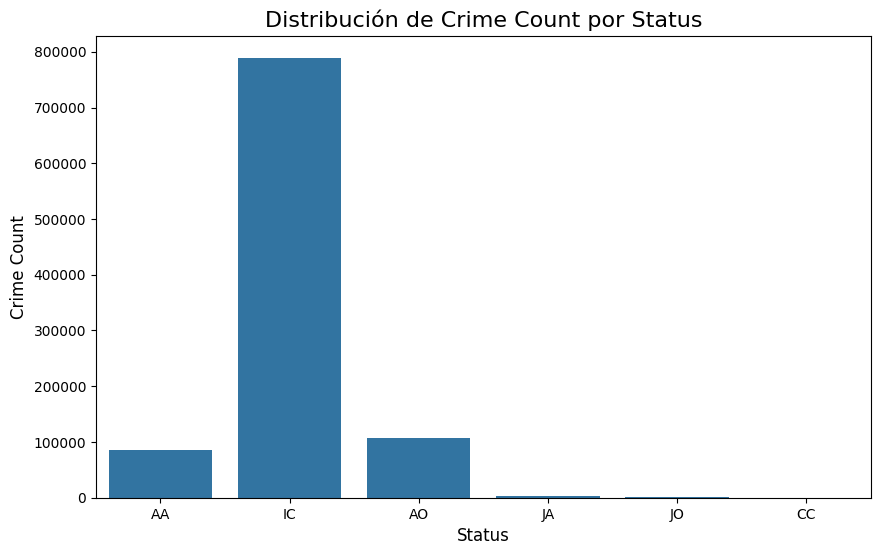

In [45]:
# Crear un gráfico de barras para visualizar Crime Count por Status
plt.figure(figsize=(10, 6))
sns.barplot(x='Status', y='Crime Count', data=status_table)

# Configurar etiquetas y título del gráfico
plt.title('Distribución de Crime Count por Status', fontsize=16)
plt.xlabel('Status', fontsize=12)
plt.ylabel('Crime Count', fontsize=12)

# Mostrar el gráfico
plt.show()

Se observa que los casos cuya investigación continua(IC) son significativamente mayores que aquellos casos donde se arresto a un adulto(AA), e incluso mayores que aquellos casos que no terminan en arresto (AO). También se observa que los casos en los que se arresta un menor (JA) son mayores que los que no terminan en arresto (JO).


# **Limpieza de datos basado en la variable objetivo**

Con los resultados que obtuvimos, eliminaremos las filas cuyo status sea CC y NAN. Esto lo haremos así para evitar que estas variables agreguen ruido al análisis. Son escenarios extremadamente poco probables, lo que puede no agregar valor al modelo.




In [46]:
# Crear un nuevo dataset eliminando las filas con Status igual a "CC" o NaN
enriched_crime_data = crime_data[~crime_data['Status'].isin(['CC']) & crime_data['Status'].notna()]

# Mostrar los primeros registros del nuevo dataset para verificar
print(enriched_crime_data.head())

# Verificar el número de registros después del filtrado
print(f"Registros después del filtrado: {len(enriched_crime_data)}")

       DR_NO               Date Rptd   DATE OCC  TIME OCC  AREA   AREA NAME  \
0  190326475  03/01/2020 12:00:00 AM 2020-03-01      2130     7    Wilshire   
1  200106753  02/09/2020 12:00:00 AM 2020-02-08      1800     1     Central   
2  200320258  11/11/2020 12:00:00 AM 2020-11-04      1700     3   Southwest   
3  200907217  05/10/2023 12:00:00 AM 2020-03-10      2037     9    Van Nuys   
4  200412582  09/09/2020 12:00:00 AM 2020-09-09       630     4  Hollenbeck   

   Rpt Dist No  Part 1-2  Crm Cd                               Crm Cd Desc  \
0          784         1     510                          VEHICLE - STOLEN   
1          182         1     330                     BURGLARY FROM VEHICLE   
2          356         1     480                             BIKE - STOLEN   
3          964         1     343  SHOPLIFTING-GRAND THEFT ($950.01 & OVER)   
4          413         1     510                          VEHICLE - STOLEN   

   ... Crm Cd 1  Crm Cd 2 Crm Cd 3 Crm Cd 4  \
0  ...   

**Feature Engineering**

Transformaremos los datos para incluir solo aquellos crimenes que concluyan en arresto, en no arresto o con investigación en curso. Para no perder la información de si es un crimen cometido por adultos o menores, agregaremos las columnas Adult_crime y Young_crime

In [47]:
# Feature engineering
enriched_crime_data = enriched_crime_data.copy()

# Crear la columna "status_modified"
enriched_crime_data.loc[:, 'status_modified'] = enriched_crime_data['Status'].replace({
    'AA': 'AR',  # Arrested
    'JA': 'AR',  # Arrested
    'AO': 'NA',  # Not Arrested
    'JO': 'NA'   # Not Arrested
})

# Crear la columna "Adult_crime"
enriched_crime_data.loc[:, 'Adult_crime'] = enriched_crime_data['Status'].apply(lambda x: 1 if x in ['AA', 'AO'] else 0)

# Crear la columna "Young_crime"
enriched_crime_data.loc[:, 'Young_crime'] = enriched_crime_data['Status'].apply(lambda x: 1 if x in ['JA', 'JO'] else 0)

# Mostrar las primeras filas del dataset para verificar las nuevas columnas
print(enriched_crime_data[['Status', 'status_modified', 'Adult_crime', 'Young_crime']].head())

  Status status_modified  Adult_crime  Young_crime
0     AA              AR            1            0
1     IC              IC            0            0
2     IC              IC            0            0
3     IC              IC            0            0
4     IC              IC            0            0


Veamos cómo queda el dataframe después de los cambios:

In [48]:
# Contar registros agrupados por "status_modified"
status_modified_counts = enriched_crime_data['status_modified'].value_counts()

# Mostrar los resultados
print(status_modified_counts)

status_modified
IC    789360
NA    108908
AR     88598
Name: count, dtype: int64


Observamos una cantidad considerablemente mayor de datos con el valor IC respecto a los demás valores. Esto puede ser problemático para la validez del modelo, por lo que evaluaremos resultados y veremos que podemos hacer con los mismos.

Recordemos las variables que agregamos al subconjunto, para la clasificación legal de los crímenes y el indicador de violencia. Agreguemos esa lógica a todo el conjunto:

In [49]:
# Aplicar la función de clasificación legal
enriched_crime_data['crime_category'] = enriched_crime_data['Crm Cd Desc'].apply(clasificar_por_codigo_penal)

# Mostrar las primeras filas para verificar el resultado
print(enriched_crime_data[['Crm Cd Desc', 'crime_category']].head())

                                Crm Cd Desc              crime_category
0                          VEHICLE - STOLEN                     Felonía
1                     BURGLARY FROM VEHICLE  Delito Contra la Propiedad
2                             BIKE - STOLEN  Delito Contra la Propiedad
3  SHOPLIFTING-GRAND THEFT ($950.01 & OVER)                     Wobbler
4                          VEHICLE - STOLEN                     Felonía


In [50]:
# Contar la cantidad de crímenes por categoría
crime_category_counts = enriched_crime_data['crime_category'].value_counts()

# Mostrar los resultados
print(crime_category_counts)

crime_category
Delito Menor                  321910
Felonía                       286889
Delito Contra la Propiedad    184666
Wobbler                       137221
Otros                          39533
Delito Violento                16647
Name: count, dtype: int64


Nuestra variable objetivo es **status_modified** vamos a analizar las variables más influyentes. Comenzaremos convirtiendo esta variable en una forma numérica:

In [51]:
from sklearn.preprocessing import LabelEncoder

# Crear un codificador
label_encoder = LabelEncoder()

# Aplicar el codificador a la columna "status_modified"
enriched_crime_data['status_modified_encoded'] = label_encoder.fit_transform(enriched_crime_data['status_modified'])

# Ver los valores únicos asignados y sus códigos
status_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Mostrar el mapeo de valores originales a numéricos
print("Mapeo de valores originales a numéricos:")
print(status_mapping)

# Verificar los primeros valores codificados
print(enriched_crime_data[['status_modified', 'status_modified_encoded']].head())

Mapeo de valores originales a numéricos:
{'AR': 0, 'IC': 1, 'NA': 2}
  status_modified  status_modified_encoded
0              AR                        0
1              IC                        1
2              IC                        1
3              IC                        1
4              IC                        1


Ahora que la columna **status_modified** ha sido codificada como **status_modified_encoded**, podemos realizar un análisis de correlación entre las variables numéricas del dataset y la variable objetivo.

In [52]:
# Seleccionar columnas numéricas
numerical_cols = enriched_crime_data.select_dtypes(include=['float64', 'int64']).columns

# Calcular la correlación con la variable objetivo codificada
correlation_matrix = enriched_crime_data[numerical_cols].corrwith(
    enriched_crime_data['status_modified_encoded']
)

# Ordenar y mostrar las correlaciones
print("Correlación de variables numéricas con status_modified_encoded:")
print(correlation_matrix.sort_values(ascending=False))

Correlación de variables numéricas con status_modified_encoded:
status_modified_encoded    1.000000
Part 1-2                   0.119178
Crm Cd 1                   0.110386
Crm Cd                     0.110331
Adult_crime                0.101760
Weapon Used Cd             0.095032
Vict Age                   0.068444
Premis Cd                  0.047679
Rpt Dist No                0.007781
AREA                       0.007654
LAT                        0.002567
Hour                       0.001641
TIME OCC                   0.001080
LON                       -0.002177
DR_NO                     -0.012785
Crm Cd 3                  -0.043354
Young_crime               -0.048683
Crm Cd 2                  -0.089109
Crm Cd 4                  -0.196853
dtype: float64


# Interpretación

De los resultados, vale acotar lo siguiente: aunque Adult_crime se derivó de Status, la baja correlación sugiere que no hay un vínculo lineal significativo que haga que Adult_crime dependa directamente de status_modified en la forma en que está codificada, por lo que Adult_crime podría estar aportando algo de información adicional al modelo.

Variables como Part 1-2, Crm Cd 1, Crm Cd, y Adult_crime podrían aportar algo de valor predictivo, aunque sus correlaciones son relativamente bajas.

Variables como LAT, LON, AREA, Hour, y TIME OCC parecen no tener una relación lineal con la variable objetivo, pero esto no significa que no puedan ser útiles en un modelo no lineal (e.g., Random Forest o Gradient Boosting).

La variable Crm Cd 4 tiene una correlación negativa alta, pero hay que ver a detalle la cantidad de valores nulos presentes.

Sin embargo para continuar explorando la relación con otras variables, agreguemos las variables que hemos creado en nuestro análisis: crime_category, violent_crime

In [53]:
from sklearn.preprocessing import LabelEncoder

# Codificar la variable crime_category
label_encoder = LabelEncoder()
enriched_crime_data['crime_category_encoded'] = label_encoder.fit_transform(enriched_crime_data['crime_category'])

# Mostrar el mapeo de categorías
category_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Mapeo de categorías de 'crime_category' a valores numéricos:")
print(category_mapping)

# Verificar los primeros registros
print(enriched_crime_data[['crime_category', 'crime_category_encoded']].head())

Mapeo de categorías de 'crime_category' a valores numéricos:
{'Delito Contra la Propiedad': 0, 'Delito Menor': 1, 'Delito Violento': 2, 'Felonía': 3, 'Otros': 4, 'Wobbler': 5}
               crime_category  crime_category_encoded
0                     Felonía                       3
1  Delito Contra la Propiedad                       0
2  Delito Contra la Propiedad                       0
3                     Wobbler                       5
4                     Felonía                       3


Ahora agreguemos la columna que clasifica los crimenes como violentos y volvamosla numerica

In [54]:
# Aplicar la función de clasificación legal
enriched_crime_data['violent_crime'] = enriched_crime_data['crime_category'].apply(create_violent_crime_column)

# Mostrar las primeras filas para verificar el resultado
print(enriched_crime_data[['crime_category', 'violent_crime']].head())

               crime_category violent_crime
0                     Felonía      Violento
1  Delito Contra la Propiedad   No Violento
2  Delito Contra la Propiedad   No Violento
3                     Wobbler   No Violento
4                     Felonía      Violento


In [55]:
from sklearn.preprocessing import LabelEncoder

def encode_columns(dataframe, columns):
    """
    Convierte columnas categóricas en numéricas usando Label Encoding.

    Parámetros:
    ----------
    dataframe : pd.DataFrame
        El DataFrame que contiene las columnas a codificar.
    columns : list
        Lista de nombres de columnas a convertir.

    Retorna:
    -------
    dataframe : pd.DataFrame
        El DataFrame actualizado con columnas numéricas.
    encoders : dict
        Diccionario con los encoders usados para cada columna.
    """
    encoders = {}
    for column in columns:
        # Crear y ajustar un LabelEncoder
        encoder = LabelEncoder()
        dataframe[f"{column}_encoded"] = encoder.fit_transform(dataframe[column])
        encoders[column] = encoder
    return dataframe, encoders

# Convertir 'crime_category' y 'violent_crime' a variables numéricas
columns_to_encode = ['crime_category', 'violent_crime']
enriched_crime_data, encoders = encode_columns(enriched_crime_data, columns_to_encode)

# Verificar las primeras filas de las columnas codificadas
print(enriched_crime_data[['crime_category', 'crime_category_encoded', 'violent_crime', 'violent_crime_encoded']].head())

               crime_category  crime_category_encoded violent_crime  \
0                     Felonía                       3      Violento   
1  Delito Contra la Propiedad                       0   No Violento   
2  Delito Contra la Propiedad                       0   No Violento   
3                     Wobbler                       5   No Violento   
4                     Felonía                       3      Violento   

   violent_crime_encoded  
0                      2  
1                      1  
2                      1  
3                      1  
4                      2  


Con estas nuevas variables ya codificadas, podemos hacer de nuevo el cálculo de la correlación.

In [56]:
# Seleccionar todas las columnas numéricas
numerical_cols = enriched_crime_data.select_dtypes(include=['float64', 'int64']).columns

# Calcular la correlación de todas las columnas numéricas con la variable objetivo 'status_modified_encoded'
correlation_with_target = enriched_crime_data[numerical_cols].corrwith(enriched_crime_data['status_modified_encoded'])

# Ordenar y mostrar las correlaciones
print("Correlación con 'status_modified_encoded':")
print(correlation_with_target.sort_values(ascending=False))

Correlación con 'status_modified_encoded':
status_modified_encoded    1.000000
Part 1-2                   0.119178
Crm Cd 1                   0.110386
Crm Cd                     0.110331
Adult_crime                0.101760
Weapon Used Cd             0.095032
Vict Age                   0.068444
Premis Cd                  0.047679
Rpt Dist No                0.007781
AREA                       0.007654
LAT                        0.002567
Hour                       0.001641
TIME OCC                   0.001080
LON                       -0.002177
DR_NO                     -0.012785
crime_category_encoded    -0.038193
Crm Cd 3                  -0.043354
Young_crime               -0.048683
violent_crime_encoded     -0.073136
Crm Cd 2                  -0.089109
Crm Cd 4                  -0.196853
dtype: float64


## Observaciones clave al comparar con la correlación anterior:

1. **Variables consistentes con impacto positivo:**
   - Variables como `Part 1-2`, `Crm Cd 1`, `Crm Cd`,y `Adult_crime` siguen siendo las más relevantes, según ambas listas.

2. **Variables diseñadas (`crime_category_encoded`, `violent_crime_encoded`):**
   - Aunque estas variables fueron creadas para simplificar y categorizar mejor los datos, su impacto directo sobre la variable objetivo es **moderado o bajo** en comparación con otras variables.

3. **Variables menos influyentes:**
   - Variables como `Rpt Dist No`, `AREA`, `LAT`, `LON`, y `Hour` tienen correlaciones insignificantes en ambas listas. Esto sugiere que podrían no ser útiles para modelos predictivos y podrían:
     - Ser descartadas del análisis.
     - Requerir mayor transformación o combinación con otras variables.

Además, recordemos que las variables Crm Cd 1 tendrán el mismo valor la mayoría de las veces. Si recordamos su significado, Crm Cd corresponde al código del crímen y Crm Cd 1 es el código del crímen de mayor prioridad cuando se reporta más de un crimen. Veamos que tan factible es fusionarlas en una sola.


In [57]:
# Contar cuántos valores son iguales entre las dos columnas
num_iguales = (enriched_crime_data['Crm Cd 1'] == enriched_crime_data['Crm Cd']).sum()

# Calcular el porcentaje de valores iguales
total_rows = len(enriched_crime_data)
porcentaje_iguales = (num_iguales / total_rows) * 100

# Mostrar los resultados
print(f"Número de valores iguales: {num_iguales}")
print(f"Porcentaje de valores iguales: {porcentaje_iguales:.2f}%")

# Explorar las diferencias entre las dos columnas
diferencias = enriched_crime_data[enriched_crime_data['Crm Cd 1'] != enriched_crime_data['Crm Cd']]
print(f"Número de filas con diferencias: {len(diferencias)}")

# Mostrar un ejemplo de las diferencias
print("Ejemplo de diferencias entre 'Crm Cd 1' y 'Crm Cd':")
print(diferencias[['Crm Cd 1', 'Crm Cd']].head())

Número de valores iguales: 984908
Porcentaje de valores iguales: 99.80%
Número de filas con diferencias: 1958
Ejemplo de diferencias entre 'Crm Cd 1' y 'Crm Cd':
      Crm Cd 1  Crm Cd
152      237.0     812
195      626.0     761
246      753.0     761
1160     626.0     761
1716     624.0     648


## ¿Deberíamos fusionar Crm Cd 1 y Crm Cd?

**Sí, con las siguientes consideraciones:**

1. **Justificación:**
   - Dado que el 99.8% de los valores coinciden, fusionar ambas columnas evita redundancias y simplifica el análisis.

2. **Manejo de diferencias:**
   - En los casos donde los valores son diferentes, haremos lo siguiente:
     - Usaremos **`Crm Cd 1`** como prioridad (ya que siempre representa el crimen principal).
     - Para efectos de la investigación, el valor de **`Crm Cd 1`** tiene mayor impacto en comparación con **`Crm Cd`**.
     -Si el valor de **`Crm Cd 1`** es nulo utilizaremos **`Crm Cd`**.

In [58]:
# Crear una nueva columna fusionada con prioridad a 'Crm Cd 1'
# Si 'Crm Cd 1' es nulo, utilizaremos el valor de 'Crm Cd'
enriched_crime_data['Crm_Cd_Merged'] = enriched_crime_data['Crm Cd 1'].combine_first(enriched_crime_data['Crm Cd'])

# Verificar los primeros registros para validar la fusión
print(enriched_crime_data[['Crm Cd 1', 'Crm Cd', 'Crm_Cd_Merged']].head())

# Verificar si quedan valores nulos en la nueva columna fusionada
nulos_merged = enriched_crime_data['Crm_Cd_Merged'].isna().sum()
print(f"Valores nulos en 'Crm_Cd_Merged': {nulos_merged}")

# Contar cuántas filas se resolvieron usando el valor de 'Crm Cd' en lugar de 'Crm Cd 1'
diferencias_resueltas = (enriched_crime_data['Crm Cd 1'].isna()).sum()
print(f"Número de valores que se tomaron de 'Crm Cd' porque 'Crm Cd 1' era nulo: {diferencias_resueltas}")

   Crm Cd 1  Crm Cd  Crm_Cd_Merged
0     510.0     510          510.0
1     330.0     330          330.0
2     480.0     480          480.0
3     343.0     343          343.0
4     510.0     510          510.0
Valores nulos en 'Crm_Cd_Merged': 0
Número de valores que se tomaron de 'Crm Cd' porque 'Crm Cd 1' era nulo: 11


## Análisis y modelado: Variables seleccionadas

Ahora que hemos definido las variables de estudio, podemos proceder con el análisis y modelado utilizando estas variables:

### **Variables seleccionadas:**

1. **Part 1-2:**
   - Tipo de reporte según el sistema UCR (crímenes graves o menores).

2. **Crm_Cd_Merged:**
   - Código del crimen fusionado que prioriza el crimen principal (`Crm Cd 1`) pero toma `Crm Cd` si es necesario.

3. **Adult_crime:**
   - Indica si el crimen está relacionado con adultos (`1`) o no (`0`).

4. **status_modified_encoded:**
   - La variable objetivo que indica el estado modificado (arrestado, no arrestado, investigación continua).

# Aplicación de PCA para reducir dimensionalidad

Tomaremos el conjunto de variables identificadas y haremos el análisis de componentes principales para poder reducir la dimensionalidad y así obtener un modelo.

In [59]:
# Importar librerías necesarias
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import pandas as pd

# Seleccionar variables independientes y la variable objetivo
X = enriched_crime_data[['Part 1-2', 'Crm_Cd_Merged', 'Adult_crime']]  # Variables independientes
y = enriched_crime_data['status_modified_encoded']  # Variable objetivo

# Escalado de las variables independientes
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Aplicar PCA para reducir la dimensionalidad a 2 componentes principales
pca = PCA(n_components=2)  # Reducimos a 2 componentes principales
X_pca = pca.fit_transform(X_scaled)

# Crear un nuevo DataFrame con las componentes principales
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['status_modified_encoded'] = y

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Entrenar un modelo Random Forest
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Realizar predicciones
y_pred = model.predict(X_test)

# Evaluar el modelo
print("Reporte de clasificación Random Forest con dos componentes principales:")
print(classification_report(y_test, y_pred))

# Mostrar la varianza explicada por las componentes principales
print("Varianza explicada por las componentes principales:")
print(pca.explained_variance_ratio_)

Reporte de clasificación Random Forest con dos componentes principales:
              precision    recall  f1-score   support

           0       0.65      0.54      0.59     17680
           1       0.99      1.00      1.00    157938
           2       0.68      0.74      0.71     21756

    accuracy                           0.93    197374
   macro avg       0.78      0.76      0.77    197374
weighted avg       0.93      0.93      0.93    197374

Varianza explicada por las componentes principales:
[0.59138106 0.30896425]


# **Interpretación de los resultados**

El reporte de clasificación evalúa el rendimiento del modelo para predecir cada clase de la variable objetivo **(status_modified_encoded)**. Los resultados incluyen las siguientes métricas:

## Interpretación de las métricas por clase:
- **Clase 0 (arrestado - AR):**
  - **Precision (65%)**: De todas las predicciones como clase 0, el 65% eran correctas.
  - **Recall (54%)**: El modelo identificó correctamente el 54% de los casos reales de clase 0.
  - **F1-Score (59%)**: Balance entre precisión y recall para esta clase.

- **Clase 1 (no arrestado - NA):**
  - **Precision (99%)**: Predicción casi perfecta de esta clase.
  - **Recall (100%)**: El modelo identificó todos los casos reales de clase 1.
  - **F1-Score (100%)**: Excelente resultado gracias a la alta precisión y recall.

- **Clase 2 (investigación continua - IC):**
  - **Precision (68%)**: De las predicciones como clase 2, el 68% eran correctas.
  - **Recall (74%)**: El modelo identificó correctamente el 74% de los casos reales.
  - **F1-Score (71%)**: Buen balance entre precisión y recall.

## Métricas globales:
- **Accuracy (93%)**: El modelo acertó en el 93% de las predicciones.
- **Macro Avg:**
  - Promedio simple entre las clases: Precision (78%), Recall (76%), F1-Score (77%).
- **Weighted Avg:**
  - Promedio ponderado: Precision (93%), Recall (93%), F1-Score (93%). Este resultado refleja el peso dominante de la clase 1.

---

# **Varianza explicada por las componentes principales**

El análisis PCA permitió reducir la dimensionalidad del dataset, y las dos componentes principales capturaron el 90% de la información total:

Varianza explicada por las componentes principales:
[0.59138106, 0.30896425]

- **PC1 (59.14%)**: Explica la mayor parte de la variación en los datos.
- **PC2 (30.90%)**: Complementa la información capturada por la primera componente.
- **Suma Total (90.04%)**: Las dos componentes juntas representan la mayoría de la variabilidad original.

---

# **Conclusiones del PCA**

1. **Desbalance de clases:**
   - La clase 1 domina el dataset (789360 registros), lo que explica su excelente rendimiento pero afecta las predicciones para las clases 0 y 2. Algunas opciones para mejorar este aspecto:
     - **Ajuste de pesos:** Configurar `class_weight='balanced'` en el modelo Random Forest.

2. **Rendimiento en clases minoritarias:**
   - El modelo debe mejorar para las clases 0 y 2, para ello deberíamos revisar las correlaciones entre las variables originales y las componentes principales.

3. **Exploración de PCA:**
   - Actualmente, se capturan el 90% de la variabilidad con dos componentes. Agregar una tercera componente podría mejorar el rendimiento sin agregar demasiada complejidad.

# **RandomForest con balanceo de clases**

Del análisis anterior observamos la desproporción que hay entre la clase 1 y las otras dos clases, por eso haremos el análisis utilizando balanceo para evaluar resultados.

In [60]:
# Importar librerías necesarias
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Entrenamiento del modelo con ajuste de pesos
model_balanced = RandomForestClassifier(random_state=42, class_weight='balanced')
model_balanced.fit(X_train, y_train)

# Predicción con el modelo ajustado
y_pred_balanced = model_balanced.predict(X_test)

# Evaluación del modelo
report_balanced = classification_report(y_test, y_pred_balanced, output_dict=True)

# Mostrar reporte de clasificación
print("Reporte de Clasificación con class_weight='balanced':")
print(classification_report(y_test, y_pred_balanced))

Reporte de Clasificación con class_weight='balanced':
              precision    recall  f1-score   support

           0       0.63      0.57      0.60     17680
           1       0.99      1.00      1.00    157938
           2       0.69      0.72      0.70     21756

    accuracy                           0.93    197374
   macro avg       0.77      0.76      0.77    197374
weighted avg       0.93      0.93      0.93    197374



# **Análisis del modelo con balanceo de clases**

## Ligeras mejoras en el balance de clases minoritarias (Clase 0 y Clase 2):
- Aunque el rendimiento de la clase 0 mejoró en términos de recall y F1-Score, las mejoras son mínimas.
- La clase 2 muestra pequeñas fluctuaciones, pero sigue siendo comparable.

## La clase dominante (Clase 1) permanece inalterada:
- Esto es esperado, dado que la clase 1 domina el dataset y tiene un alto rendimiento tanto en el modelo original como en el ajustado.

## Macro avg y Weighted avg apenas cambian:
- Esto indica que el ajuste de pesos con `class_weight='balanced'` tiene un impacto más notable en las clases minoritarias, sin afectar significativamente las métricas globales.

En conclusión, el incluir balanceo al análisis de componentes principales ayuda ligeramente a mejorar el rendimiento y balancear el rendimiento entre las clases. Sin embargo, estas mejoras no son drámaticas, probablemente porque la clase 1 sigue dominando en el dataset.

## **Selección de variables alternativas para un nuevo modelo.**

Elegiremos un nuevo subconjunto de variables aplicando PCA como parte de un análisis exploratorio. Esto nos podría dar indicios de un modelo que permita explicar mejor la variable de estudio.

Para ello, elegiremos las variables de mayor importancia aplicando random forest a todas las variables numéricas del dataframe. Luego, seleccionaremos las características más importantes y haremos análisis PCA con ellas.

## Random Forest para elegir las variables más importantes

Columnas no numéricas: Index(['Date Rptd', 'AREA NAME', 'Crm Cd Desc', 'Mocodes', 'Vict Sex',
       'Vict Descent', 'Premis Desc', 'Weapon Desc', 'LOCATION',
       'Cross Street', 'Franja Horaria', 'crime_category', 'violent_crime'],
      dtype='object')
Columnas datetime (post-conversión): ['DATE OCC']


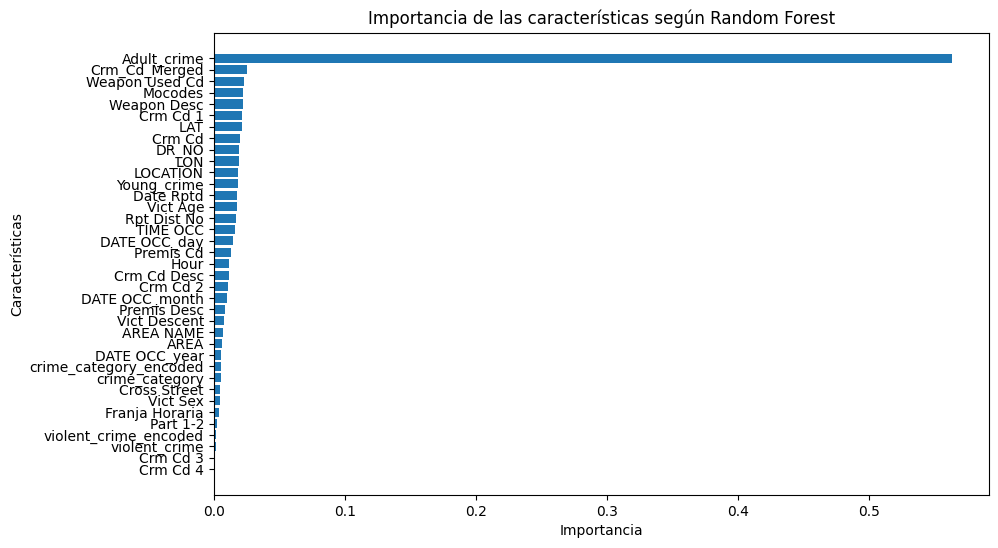

In [61]:
# variable objetivo (Y)
y = enriched_crime_data['status_modified_encoded']  # Variable objetivo

# Eliminamos la variable objetivo y sus variantes codificadas de las características (X)
X = enriched_crime_data.drop(columns=['Status', 'Status Desc', 'status_modified','status_modified_encoded'])

# Identificar columnas no numéricas
non_numeric_columns = X.select_dtypes(include=['object']).columns
print("Columnas no numéricas:", non_numeric_columns)

# Identificar columnas con tipo datetime
datetime_columns = X.select_dtypes(include=['datetime64']).columns.tolist()

# Convertir explícitamente columnas datetime si no tienen el tipo correcto
for col in non_numeric_columns:  # Revisamos las columnas que podrían ser fechas
    if col in ['DATE OCC']:  # Ajusta esto con las columnas datetime detectadas
        X[col] = pd.to_datetime(X[col], errors='coerce')

# Extraer componentes temporales (año, mes, día) de las columnas datetime
datetime_columns = X.select_dtypes(include=['datetime64']).columns.tolist()  # Vuelve a identificar datetime64
print("Columnas datetime (post-conversión):", datetime_columns)

for col in datetime_columns:
    X[f"{col}_year"] = X[col].dt.year
    X[f"{col}_month"] = X[col].dt.month
    X[f"{col}_day"] = X[col].dt.day
    X.drop(columns=[col], inplace=True)  # Elimina la columna original si no es necesaria

# Codificar texto con Label Encoding
from sklearn.preprocessing import LabelEncoder

for col in non_numeric_columns:
    if col not in datetime_columns:  # Asegurarse de no procesar columnas ya convertidas
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])

# Dividir el dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar el modelo de Random Forest
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Obtener la importancia de las características
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Visualizar las características más importantes
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.title('Importancia de las características según Random Forest')
plt.gca().invert_yaxis()
plt.show()

# **Interpretación del gráfico**

## 1. Variable más importante:
- **Adult_crime**: Esta variable tiene la mayor importancia según el modelo. Indica que si un crimen está relacionado con adultos es un factor clave para predecir la variable objetivo.

## 2. Otras variables significativas:
- **Crm_Cd_Merged**: El código fusionado del crimen también tiene un impacto importante, lo que sugiere que el tipo de crimen es relevante para la predicción.
- **Weapon Used Cd y Weapon Desc**: Estas variables relacionadas con armas tienen una contribución significativa, lo que indica que el uso de armas en los crímenes afecta la clasificación.

## 3. Variables con contribución moderada:
- Variables como **Mocodes**, **Crm Cd 1**, **LAT**, y **LOCATION** tienen una importancia menor, pero aún aportan algo de información al modelo.

## 4. Variables con menor importancia:
- Varias variables relacionadas con fechas, descripciones de la víctima, y códigos adicionales (**violent_crime_encoded**, **Cross Street**, etc.) tienen una importancia muy baja. Estas podrían ser candidatas para ser eliminadas en futuros modelos para simplificar el análisis.

Sin embargo, la variable **Weapon Used Cd y Weapon Desc** tiene un alto porcentaje de datos faltantes y esto afecta significativamente su calidad como variable predictiva, lo que puede limitar su utilidad en el modelo.

Veamos cuantos datos faltantes tenemos


In [141]:
# Calcular el porcentaje de datos faltantes para las columnas 'Weapon Used Cd' y 'Weapon Desc'
missing_weapon_used_cd = enriched_crime_data['Weapon Used Cd'].isnull().mean() * 100
missing_weapon_desc = enriched_crime_data['Weapon Desc'].isnull().mean() * 100

# Imprimir los porcentajes
print(f"Porcentaje de datos faltantes en 'Weapon Used Cd': {missing_weapon_used_cd:.2f}%")
print(f"Porcentaje de datos faltantes en 'Weapon Desc': {missing_weapon_desc:.2f}%")

Porcentaje de datos faltantes en 'Weapon Used Cd': 67.06%
Porcentaje de datos faltantes en 'Weapon Desc': 67.06%


Esto implica que más de la mitad de los datos para esta característica están ausentes, lo que va a afectar su utilidad en el modelo. Si los valores faltantes no están distribuidos aleatoriamente (es decir, si están relacionados con ciertos tipos de crímenes o eventos), esto puede introducir sesgos en el modelo. Para tratar los datos faltantes usaremos información basada en otras columnas.


In [142]:
# Imputar los valores faltantes con la moda
weapon_used_cd_mode = enriched_crime_data['Weapon Used Cd'].mode()[0]
weapon_desc_mode = enriched_crime_data['Weapon Desc'].mode()[0]

# Asignar las columnas imputadas directamente al DataFrame
enriched_crime_data['Weapon Used Cd'] = enriched_crime_data['Weapon Used Cd'].fillna(weapon_used_cd_mode)
enriched_crime_data['Weapon Desc'] = enriched_crime_data['Weapon Desc'].fillna(weapon_desc_mode)

# Calcular el porcentaje de nulos y la cantidad de valores distintos para cada columna
null_percentage = enriched_crime_data.isnull().mean() * 100  # Porcentaje de valores nulos
unique_values_count = enriched_crime_data.nunique()  # Cantidad de valores únicos

# Crear un DataFrame para mostrar ambos resultados
column_summary = pd.DataFrame({
    'Porcentaje Nulos (%)': null_percentage,
    'Valores Únicos': unique_values_count
}).sort_values(by='Porcentaje Nulos (%)', ascending=False)

# Imprimir el resumen
print(column_summary)

# Obtener y mostrar los valores distintos de la columna 'Weapon Desc'
distinct_values_weapon_desc = enriched_crime_data['Weapon Desc'].unique()
print("Valores distintos en 'Weapon Desc':")
print(distinct_values_weapon_desc)

                         Porcentaje Nulos (%)  Valores Únicos
Crm Cd 4                            99.993920               6
Crm Cd 3                            99.767344              35
Crm Cd 2                            93.045358             123
Cross Street                        84.601557           10076
Mocodes                             14.943265          292702
Vict Descent                        14.248844              20
Vict Sex                            14.247628               5
Premis Desc                          0.058873             305
Premis Cd                            0.001520             313
Crm Cd 1                             0.001115             142
Hour                                 0.000000              24
violent_crime_encoded                0.000000               3
violent_crime                        0.000000               3
crime_category_encoded               0.000000               6
LAT                                  0.000000            5391
LON     

Volveremos a entrenar un modelo con las variables principales del análisis y con las variables imputadas

In [143]:
# **1. Seleccionar las Variables Más Importantes**
important_features = ['Adult_crime', 'Crm_Cd_Merged', 'Weapon Used Cd', 'Weapon Desc']
X_selected = enriched_crime_data[important_features].copy()  # Crear una copia explícita para evitar problemas

# **2. Codificar las Variables Categóricas**
from sklearn.preprocessing import LabelEncoder

# Crear un diccionario para guardar los codificadores de LabelEncoder (opcional si necesitas revertir la codificación)
label_encoders = {}

# Codificar columnas categóricas usando .loc para evitar el warning
for col in ['Weapon Used Cd', 'Weapon Desc']:
    le = LabelEncoder()
    X_selected.loc[:, col] = le.fit_transform(X_selected[col].astype(str))  # Convertir a string para evitar errores
    label_encoders[col] = le  # Guardar el codificador si necesitas revertir luego

# **3. Escalar las Variables**
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# **4. Aplicar PCA**
from sklearn.decomposition import PCA

# Aplicar PCA manteniendo el 95% de la varianza
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

# Ver la varianza explicada por cada componente principal
print("Varianza explicada por cada componente principal:")
print(pca.explained_variance_ratio_)

# Número de componentes seleccionados
print(f"Componentes seleccionados: {pca.n_components_}")

# **5. Dividir los Datos para Entrenar y Probar**
from sklearn.model_selection import train_test_split

# Variable objetivo
y = enriched_crime_data['status_modified_encoded']  # Reemplaza con tu variable objetivo

X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# **6. Entrenar el Modelo**
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Entrenar el modelo
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
print("Reporte de Clasificación de random forest con variables mas importantes y explicando 95% de la varianza:")
print(classification_report(y_test, y_pred))

Varianza explicada por cada componente principal:
[0.44068139 0.2817193  0.18842359 0.08917572]
Componentes seleccionados: 4
Reporte de Clasificación de random forest con variables mas importantes y explicando 95% de la varianza:
              precision    recall  f1-score   support

           0       0.65      0.54      0.59     17680
           1       0.99      1.00      1.00    157938
           2       0.68      0.74      0.71     21756

    accuracy                           0.93    197374
   macro avg       0.78      0.76      0.77    197374
weighted avg       0.93      0.93      0.93    197374



# Comparación de Métricas Clave

| Modelo                      | Accuracy | Macro Precision | Macro Recall | Macro F1-Score | Clase 0 F1 | Clase 2 F1 |
|-----------------------------|----------|-----------------|--------------|----------------|------------|------------|
| **Random Forest (2 PCs)**   | 93%      | 78%             | 76%          | 77%            | 59%        | 71%        |
| **Random Forest (Balanced)**| 93%      | 77%             | 76%          | 77%            | 60%        | 70%        |
| **Random Forest (4 PCs)**   | 93%      | 78%             | 76%          | 77%            | 59%        | 71%        |





## **Conclusión**
- Los tres modelos tienen un desempeño general muy similar en términos de accuracy y métricas promedio.
- Si el objetivo es maximizar el rendimiento en todas las clases, especialmente las minoritarias, el **Random Forest (Balanced)** es preferible.
- Si el objetivo es simplificar el modelo y conservar el rendimiento general, el **modelo Random Forest basado en 2 PCS** es una buena opción.

En nuestro caso, lo que queremos es maximizar el rendimiento, pero exploraremos otros modelos para ver si conseguimos alguno que funcione mejor.

## **XGBoost**

XGBoost es un algoritmo basado en árboles de decisión que combina modelos simples (boosting) para generar un modelo final robusto y preciso. Funciona bien con datos transformados por PCA, ya que puede aprovechar las relaciones presentes en los componentes principales y ha demostrado ser eficiente en escenarios donde hay clases mayoritarias y minoritarias.

Entrenemos un modelo XGBoost con los datos del modelo basado en 2 PC

In [144]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las variables independientes y la variable objetivo
X = enriched_crime_data[['Part 1-2', 'Crm_Cd_Merged', 'Adult_crime']]  # Variables independientes
y = enriched_crime_data['status_modified_encoded']  # Variable objetivo

# Normalizar los datos (recomendado antes de aplicar PCA)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Aplicar PCA con 2 componentes principales
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Mostrar la varianza explicada por cada componente principal
explained_variance = pca.explained_variance_ratio_
print("Varianza explicada por cada componente principal:")
print(explained_variance)

# Dividir el dataset en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Entrenar el modelo XGBoost
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = xgb_model.predict(X_test)

# Evaluar el modelo
accuracy = accuracy_score(y_test, y_pred)
print("\nAccuracy del modelo XGBoost:", accuracy)

print("\nMatriz de Confusión:")
print(confusion_matrix(y_test, y_pred))

print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred))


Varianza explicada por cada componente principal:
[0.59138106 0.30896425]


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning:

[23:03:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.





Accuracy del modelo XGBoost: 0.9294587939647573

Matriz de Confusión:
[[  9639    639   7402]
 [     0 157938      0]
 [  5472    410  15874]]

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.64      0.55      0.59     17680
           1       0.99      1.00      1.00    157938
           2       0.68      0.73      0.71     21756

    accuracy                           0.93    197374
   macro avg       0.77      0.76      0.76    197374
weighted avg       0.93      0.93      0.93    197374



# **Comparación de Resultados: XGBoost vs Modelos Anteriores**


# Comparación de Modelos: XGBoost vs Modelos Anteriores

## **1. Desempeño Global**
| Modelo                          | Accuracy | Macro Precision | Macro Recall | Macro F1-Score |
|---------------------------------|----------|-----------------|--------------|----------------|
| **Random Forest (2 PCs)**       | 93%      | 78%             | 76%          | 77%            |
| **Random Forest (Balanced)**    | 93%      | 77%             | 76%          | 77%            |
| **Random Forest (4 PCs)**       | 93%      | 78%             | 76%          | 77%            |
| **XGBoost (2 PCs)**             | 93%      | 77%             | 76%          | 76%            |

- **Accuracy:**
  - Todos los modelos alcanzan un accuracy del 93%, indicando un desempeño global similar.
- **Macro Precision, Recall y F1-Score:**
  - El modelo **XGBoost** tiene un Macro F1-Score ligeramente menor (76%) en comparación con los modelos de Random Forest (77%).
  - **Random Forest (2 PCs y 4 PCs)** mantiene un desempeño balanceado entre las métricas.

---

## **2. Desempeño por Clase**

### **Clase 0 (Menos Resuelto)**
| Modelo                          | Precision | Recall | F1-Score |
|---------------------------------|-----------|--------|----------|
| **Random Forest (2 PCs)**       | 65%       | 54%    | 59%      |
| **Random Forest (Balanced)**    | 63%       | 57%    | 60%      |
| **Random Forest (4 PCs)**       | 65%       | 54%    | 59%      |
| **XGBoost (2 PCs)**             | 64%       | 55%    | 59%      |

- **XGBoost:**
  - Tiene un desempeño similar a Random Forest en precisión (64%) y F1-Score (59%), pero su **recall** es ligeramente mejor que los modelos no balanceados.
- **Random Forest Balanced:**
  - Ofrece el mejor recall (57%), capturando más casos reales de Clase 0.

---

### **Clase 1 (Mayoritaria - Resuelto)**
| Modelo                          | Precision | Recall | F1-Score |
|---------------------------------|-----------|--------|----------|
| **Random Forest (2 PCs)**       | 99%       | 100%   | 100%     |
| **Random Forest (Balanced)**    | 99%       | 100%   | 100%     |
| **Random Forest (4 PCs)**       | 99%       | 100%   | 100%     |
| **XGBoost (2 PCs)**             | 99%       | 100%   | 100%     |

- Todos los modelos tienen un desempeño perfecto en esta clase debido al desbalance del dataset.

---

### **Clase 2 (Otro Estado)**
| Modelo                          | Precision | Recall | F1-Score |
|---------------------------------|-----------|--------|----------|
| **Random Forest (2 PCs)**       | 68%       | 74%    | 71%      |
| **Random Forest (Balanced)**    | 69%       | 72%    | 70%      |
| **Random Forest (4 PCs)**       | 68%       | 74%    | 71%      |
| **XGBoost (2 PCs)**             | 68%       | 73%    | 71%      |

- **XGBoost:**
  - Su desempeño es similar a los modelos Random Forest en esta clase.
  - Ofrece un recall ligeramente mejor que el modelo balanceado (73% frente a 72%).

---

## **3. Matriz de Confusión (XGBoost)**
| Verdadero \ Predicho | Clase 0 | Clase 1 | Clase 2 |
|-----------------------|---------|---------|---------|
| **Clase 0**          | 9639    | 639     | 7402    |
| **Clase 1**          | 0       | 157938  | 0       |
| **Clase 2**          | 5472    | 410     | 15874   |

### Observaciones:
- **Errores en Clase 0:**
  - **XGBoost** clasifica incorrectamente 7402 casos reales de Clase 0 como Clase 2, similar a los modelos de Random Forest.
- **Errores en Clase 2:**
  - Clasifica 5472 casos reales de Clase 2 como Clase 0, comparable a Random Forest.

---

## **4. Análisis del PCA**
- En los modelos con PCA, los **dos componentes principales** explican aproximadamente:
  - **59.14% (Componente 1)** y **30.89% (Componente 2)** de la varianza.
- Esto indica que los dos componentes capturan el 90% de la información de las variables seleccionadas.

---

## **Conclusiones Clave**
1. **Desempeño Global:**
   - Todos los modelos tienen un desempeño general similar (93% de accuracy).
   - **Random Forest** (2 o 4 PCs) y **XGBoost** tienen un desempeño comparable, con ligeras diferencias en precisión y recall.

2. **Ventajas de Random Forest:**
   - El modelo balanceado mejora el recall en la clase menos representada (Clase 0), haciéndolo ideal para identificar más casos de esta clase.
   - Su desempeño es consistente con 2 y 4 componentes principales.

3. **Ventajas de XGBoost:**
   - Ofrece flexibilidad y eficiencia, con un desempeño competitivo frente a Random Forest.
   - Es más adecuado para ajustes finos de hiperparámetros, lo que podría mejorar aún más su desempeño.

---

Probaremos con un nuevo modelo.


  ## **Regresión Logística**
  
  Para seguir con nuestro análisis, utilicemos un modelo de regresión logística, más fácil de interpretar y considerando balanceo. Este modelo es más eficiente en su entrenamiento y evaluación

In [145]:
# Importar librerías necesarias
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler

# Seleccionar las variables independientes y la variable objetivo
X = enriched_crime_data[['Part 1-2', 'Crm_Cd_Merged', 'Adult_crime']]  # Variables independientes
y = enriched_crime_data['status_modified_encoded']  # Variable objetivo

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Escalar las variables independientes (recomendado para regresión logística)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Entrenar el modelo de regresión logística
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
log_reg.fit(X_train_scaled, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = log_reg.predict(X_test_scaled)

# Evaluar el modelo
print("Accuracy del modelo de regresión logística:", accuracy_score(y_test, y_pred))
print("\nMatriz de Confusión:")
print(confusion_matrix(y_test, y_pred))
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



Accuracy del modelo de regresión logística: 0.9209318349934642

Matriz de Confusión:
[[  9098    639   7943]
 [     0 157938      0]
 [  6614    410  14732]]

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.58      0.51      0.54     17680
           1       0.99      1.00      1.00    157938
           2       0.65      0.68      0.66     21756

    accuracy                           0.92    197374
   macro avg       0.74      0.73      0.73    197374
weighted avg       0.92      0.92      0.92    197374



# **Comparación de Modelos: Regresión Logística vs modelos anteriores**

# Comparación de Regresión Logística con Modelos Anteriores

## **1. Desempeño Global**
| Modelo                          | Accuracy | Macro Precision | Macro Recall | Macro F1-Score |
|---------------------------------|----------|-----------------|--------------|----------------|
| **Random Forest (2 PCs)**       | 93%      | 78%             | 76%          | 77%            |
| **Random Forest (Balanced)**    | 93%      | 77%             | 76%          | 77%            |
| **Random Forest (4 PCs)**       | 93%      | 78%             | 76%          | 77%            |
| **XGBoost (2 PCs)**             | 93%      | 77%             | 76%          | 76%            |
| **Regresión Logística**         | 92%      | 74%             | 73%          | 73%            |

### Observaciones:
- **Accuracy:**
  - La **Regresión Logística** tiene un accuracy ligeramente menor (92%) comparado con los modelos de Random Forest y XGBoost (93%).
- **Macro Metrics:**
  - La Regresión Logística muestra valores más bajos en precisión, recall y F1-Score promedio en comparación con los otros modelos.
  - Esto indica que tiene más dificultades para manejar las clases menos representadas (`Clase 0` y `Clase 2`).

---

## **2. Desempeño por Clase**

### **Clase 0 (Menos Resuelto)**
| Modelo                          | Precision | Recall | F1-Score |
|---------------------------------|-----------|--------|----------|
| **Random Forest (2 PCs)**       | 65%       | 54%    | 59%      |
| **Random Forest (Balanced)**    | 63%       | 57%    | 60%      |
| **Random Forest (4 PCs)**       | 65%       | 54%    | 59%      |
| **XGBoost (2 PCs)**             | 64%       | 55%    | 59%      |
| **Regresión Logística**         | 58%       | 51%    | 54%      |

### Observaciones:
- La **Regresión Logística** tiene la peor precisión (58%) y recall (51%) para la Clase 0.
- Los modelos Random Forest y XGBoost tienen un mejor desempeño en esta clase, con F1-Scores de 59%-60%.

---

### **Clase 1 (Mayoritaria - Resuelto)**
| Modelo                          | Precision | Recall | F1-Score |
|---------------------------------|-----------|--------|----------|
| **Random Forest (2 PCs)**       | 99%       | 100%   | 100%     |
| **Random Forest (Balanced)**    | 99%       | 100%   | 100%     |
| **Random Forest (4 PCs)**       | 99%       | 100%   | 100%     |
| **XGBoost (2 PCs)**             | 99%       | 100%   | 100%     |
| **Regresión Logística**         | 99%       | 100%   | 100%     |

### Observaciones:
- Todos los modelos tienen un desempeño perfecto en esta clase debido al desbalance del dataset.

---

### **Clase 2 (Otro Estado)**
| Modelo                          | Precision | Recall | F1-Score |
|---------------------------------|-----------|--------|----------|
| **Random Forest (2 PCs)**       | 68%       | 74%    | 71%      |
| **Random Forest (Balanced)**    | 69%       | 72%    | 70%      |
| **Random Forest (4 PCs)**       | 68%       | 74%    | 71%      |
| **XGBoost (2 PCs)**             | 68%       | 73%    | 71%      |
| **Regresión Logística**         | 65%       | 68%    | 66%      |

### Observaciones:
- La **Regresión Logística** tiene un desempeño aceptable pero inferior a los modelos Random Forest y XGBoost en esta clase:
  - F1-Score de 66% frente a 70%-71% de los otros modelos.

---

## **3. Matriz de Confusión (Regresión Logística)**
| Verdadero \ Predicho | Clase 0 | Clase 1 | Clase 2 |
|-----------------------|---------|---------|---------|
| **Clase 0**          | 9098    | 639     | 7943    |
| **Clase 1**          | 0       | 157938  | 0       |
| **Clase 2**          | 6614    | 410     | 14732   |

### Comparación con Otros Modelos:
- **Errores en Clase 0:**
  - La Regresión Logística clasifica incorrectamente **7943 casos reales de Clase 0** como Clase 2, lo que es más alto que en los modelos Random Forest o XGBoost.
- **Errores en Clase 2:**
  - Clasifica incorrectamente **6614 casos reales de Clase 2** como Clase 0, lo que también es más alto que los otros modelos.

---

## **4. Conclusiones Clave**
1. **Desempeño General:**
   - La **Regresión Logística** tiene un desempeño razonable (accuracy de 92%) pero no supera a los modelos basados en Random Forest o XGBoost en ninguna métrica.

2. **Manejo de Clases Menos Representadas:**
   - La Regresión Logística tiene más dificultades con las clases menos representadas (`Clase 0` y `Clase 2`):
     - **Clase 0:** Tiene la peor F1-Score (54%) debido a bajo recall.
     - **Clase 2:** Tiene un F1-Score aceptable (66%) pero inferior al de Random Forest y XGBoost (71%).

3. **Ventajas de Regresión Logística:**
   - Es un modelo más **simple y rápido** de entrenar y evaluar, ideal para aplicaciones en tiempo real o cuando la interpretabilidad es importante.
   - Funciona razonablemente bien sin optimización extensa.

4. **Ventajas de Random Forest y XGBoost:**
   - Ofrecen un mejor desempeño general, especialmente en las clases menos representadas, y manejan mejor patrones no lineales.

---

  En resumen, **Random Forest (con balanceo o PCA)** es la opción más confiable, equilibrada y robusta para este caso.

# Optimización utilizando grid search

Mediante el uso de grid search, podriamos encontrar la combinación óptima de hiperparámetros para mejorar el desempeño del modelo que elegimos en t{erminos de precisión, recall y generalización. Esta optimización nos permitirá aprovechar al máximo la información de dichas componentes principales.

Grid search nos permite explorar de manera sistemática diferentes combinaciones de parámetros mediante validación cruzada, asegurando que el modelo no solo funcione bien en el conjunto de entrenamiento, sino que también generalice adecuadamente a nuevos datos. Esto es fundamental para maximizar el desempeño del modelo mientras se minimiza el riesgo de depender excesivamente de una configuración arbitraria de parámetros.

In [148]:
# Importar librerías necesarias
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Seleccionar variables independientes y la variable objetivo
X = enriched_crime_data[['Part 1-2', 'Crm_Cd_Merged', 'Adult_crime']]  # Variables independientes
y = enriched_crime_data['status_modified_encoded']  # Variable objetivo

# Escalado de las variables independientes
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Aplicar PCA para reducir la dimensionalidad a 2 componentes principales
pca = PCA(n_components=2)  # Reducimos a 2 componentes principales
X_pca = pca.fit_transform(X_scaled)

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Configurar los hiperparámetros para el Grid Search
param_grid = {
    'n_estimators': [100, 200],        # Reducimos el número de árboles
    'max_depth': [None, 10],          # Limitamos la profundidad máxima
    'min_samples_split': [5, 10],     # Solo probamos divisiones más grandes
    'min_samples_leaf': [2, 4]        # Reducimos el rango de tamaños mínimos de hojas
}

# Configurar Grid Search
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',  # Métrica de evaluación
    cv=5,                # Validación cruzada con 5 folds
    verbose=2,           # Mostrar progreso en consola
    n_jobs=-1            # Usar todos los núcleos disponibles
)

# Entrenar Grid Search
grid_search.fit(X_train, y_train)

# Imprimir los mejores parámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Evaluar el modelo con los mejores parámetros
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

print("\nAccuracy del modelo optimizado:", accuracy_score(y_test, y_pred))
print("\nReporte de Clasificación del modelo optimizado:")
print(classification_report(y_test, y_pred))

# Mostrar la varianza explicada por las componentes principales
print("\nVarianza explicada por las componentes principales:")
print(pca.explained_variance_ratio_)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


KeyboardInterrupt: 

El código anterior tarda demasiado en ejecutarse, por lo que optaremos por randomized search

In [ ]:
# Importar librerías necesarias
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd
import numpy as np

# Seleccionar variables independientes y la variable objetivo
X = enriched_crime_data[['Part 1-2', 'Crm_Cd_Merged', 'Adult_crime']]  # Variables independientes
y = enriched_crime_data['status_modified_encoded']  # Variable objetivo

# Escalado de las variables independientes
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Aplicar PCA para reducir la dimensionalidad a 2 componentes principales
pca = PCA(n_components=2)  # Reducimos a 2 componentes principales
X_pca = pca.fit_transform(X_scaled)

# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Espacio de búsqueda de hiperparámetros
param_distributions = {
    'n_estimators': [100, 200, 300, 500],  # Número de árboles
    'max_depth': [10, 20, 30, None],      # Profundidad máxima del árbol
    'min_samples_split': [2, 5, 10],      # Mínimo de muestras para dividir un nodo
    'min_samples_leaf': [1, 2, 4],        # Mínimo de muestras en una hoja
    'bootstrap': [True, False]            # Usar o no bootstrap
}

# Configurar Randomized Search
random_search = RandomizedSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_distributions=param_distributions,
    n_iter=20,  # Número de combinaciones aleatorias a probar
    cv=5,       # Validación cruzada con 5 folds
    scoring='accuracy',  # Métrica para evaluar
    verbose=2,  # Mostrar progreso
    random_state=42,
    n_jobs=-1   # Usar todos los núcleos disponibles
)

# Entrenar Randomized Search
random_search.fit(X_train, y_train)

# Imprimir los mejores parámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)

# Evaluar el modelo con los mejores parámetros
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

# Resultados finales
print("\nAccuracy del modelo optimizado:", accuracy_score(y_test, y_pred))
print("\nReporte de Clasificación del modelo optimizado:")
print(classification_report(y_test, y_pred))

# Mostrar la varianza explicada por las componentes principales
print("\nVarianza explicada por las componentes principales:")
print(pca.explained_variance_ratio_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


Este modelo tampoco se pudo ejecutar porque hacía que el colab no respondiera.

# **Conclusiones**

El modelo que resulta preferible para la variable objetivo es el Random Forest (con balanceo o PCA)

## **1. ¿Cómo funciona el modelo Random Forest?**
- Este modelo clasifica los casos en tres categorías basadas en **datos históricos de crímenes**:
  1. **Clase 0**: Crímenes donde la persona es arrestada.
  2. **Clase 1**: Crímenes donde no hay arresto.
  3. **Clase 2**: Crímenes bajo investigación continua.
- Random Forest trabaja combinando **múltiples árboles de decisión** para hacer predicciones más robustas y confiables.

---

## **2. ¿Qué datos necesita el modelo?**
Para que el modelo pueda predecir correctamente, se necesitan los siguientes datos del usuario:

1. **Part 1-2**:
   - Tipo de reporte del crimen según el sistema UCR (crímenes graves o menores).
2. **Crm_Cd_Merged**:
   - Código que representa el tipo de crimen principal (e.g., robo, asalto).
3. **Adult_crime**:
   - Indicador de si el crimen está relacionado con adultos (1) o no (0).

---

## **3. ¿Cómo se usan estos datos?**
- **Paso 1**: El usuario proporciona los valores de estas tres variables.
- **Paso 2**: El modelo utiliza estas entradas para calcular probabilidades basadas en patrones aprendidos de los datos históricos.
- **Paso 3**: Se genera una predicción de la clase más probable (0, 1, o 2), indicando qué acción podría ocurrir (arresto, no arresto, o investigación continua).

---

## **4. Ejemplo Práctico**
Supongamos que un usuario ingresa los siguientes valores:
- **Part 1-2**: 1 (Crimen grave).
- **Crm_Cd_Merged**: 510 (Asalto con arma).
- **Adult_crime**: 1 (Crimen relacionado con adultos).

**Resultado:**
- El modelo evalúa estos datos y podría predecir que este crimen pertenece a la **Clase 0 (Arrestado)** con una probabilidad alta.

---

## **5. ¿Qué hace el modelo internamente?**
El modelo divide los datos en múltiples árboles de decisión:
1. Cada árbol evalúa los valores ingresados en cada variable y decide cómo clasificarlos.
2. Los árboles votan y se combina el resultado para obtener una predicción final.

Por ejemplo:
- Si el **Crm_Cd_Merged** indica un crimen grave y el **Adult_crime** es 1, la mayoría de los árboles podrían votar por la Clase 0 (arresto).
- Si el crimen es menor (Part 1-2 = 2) y no involucra adultos, los árboles podrían votar por la Clase 1 (no arresto).

---

## **6. Beneficios para el Usuario**
1. **Predicciones confiables:** Basado en datos históricos con alta precisión.
2. **Explicabilidad:** El modelo utiliza variables relevantes que tienen sentido práctico para los usuarios.
3. **Flexibilidad:** Puede ajustarse a diferentes escenarios según los datos proporcionados.

---

## **7. Limitaciones a Considerar**
1. **Precisión depende de los datos ingresados:**
   - Si los valores ingresados no son precisos, la predicción podría no ser confiable.
2. **No considera factores externos:**
   - Por ejemplo, cambios recientes en políticas policiales o circunstancias excepcionales.

---

## **8. Resumen para el Usuario**
"Este modelo utiliza las variables relacionadas con el tipo de crimen, la gravedad, y si involucra adultos para hacer una predicción. Basándose en patrones históricos, nos indica si es probable que ocurra un arresto, no haya arresto, o el caso quede en investigación continua. Mientras más precisos sean los datos ingresados, más confiable será la predicción."